In [1]:
readexprs = function(path, lbl){
    
    df = read.csv(path , sep=',')
    rownames(df) = df$X
    df = df[, -1]
    
    return(df)
}

In [2]:
R1 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/rnaseq_folfox_r.csv')
S1 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/rnaseq_folfox_s.csv')

In [3]:
stage1 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/stage1.csv')
stage23 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/stage23.csv')
stage4 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/stage4.csv')

In [4]:
readexprs = function(path, lbl){
    
    df = read.csv(path , sep=',')
    rownames(df) = df$X
    df = df[, -1]
    
    names = paste0(lbl, 1:ncol(df))
    colnames(df) = names
    
    return(df)
}

In [5]:
GSE19860 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE19860_RESISTANT_FOLFOX.csv', 'R')
GSE19860_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE19860_SENSITIVE_FOLFOX.csv', 'S') 

In [6]:
GSE28702 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE28702_RESISTANT_FOLFOX.csv', 'R')
GSE28702_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE28702_SENSITIVE_FOLFOX.csv', 'S')

In [7]:
GSE52735 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE52735_RESISTANT_FOLFOX.csv', 'R') 
GSE52735_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE52735_SENSITIVE_FOLFOX.csv', 'S') 

In [8]:
GSE69657 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE69657_RESISTANT_FOLFOX.csv', 'R')
GSE69657_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE69657_SENSITIVE_FOLFOX.csv', 'S')

In [9]:
GSE72968 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE72968_RESISTANT_FOLFOX.csv', 'R')
GSE72968_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE72968_SENSITIVE_FOLFOX.csv', 'S')

In [10]:
GSE81653 = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE81653_FOLFOX_RESISTANT.csv', 'R')
GSE81653_S = readexprs('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/expression/GSE81653_FOLFOX_SENSITIVE.csv', 'S')

In [44]:
merge_dataset = function(c1,c2,c3,c4,c5, lbl){
    
    df = cbind(c1,c2,c3,c4,c5)
    names = paste0(lbl, 1:ncol(df))
    colnames(df) = names
    
    return(df)
    
}

In [45]:
R = merge_dataset(GSE19860, GSE72968, GSE69657, GSE52735, GSE28702, 'R')

In [46]:
S = merge_dataset(GSE19860_S, GSE72968_S, GSE69657_S, GSE52735_S, GSE28702_S, 'S')

In [79]:
edgeR = function(R, S, name){
    
    library(edgeR)
    library(clusterProfiler)
    library(dplyr)
    library(org.Hs.eg.db)
    library(enrichplot)
    library(mixOmics)
    library(RColorBrewer)
    library(HTSFilter)
    
    Res = 'R'
    Sen = 'S'
    
    samples = factor(c(rep(Res, ncol(R)), rep(Sen, ncol(S))))
    replicates = c(ncol(R), ncol(S))
    
    ncolR = ncol(R)
    ncolS = ncol(S)
    
    Group = relevel(samples, ref="R")
    design = model.matrix(~0+Group)
    colnames(design) = levels(Group)    
    
    dgList = cbind(R, S) 
    
    sampleDists = as.matrix(dist(t(dgList)))
    cimColor = colorRampPalette(rev(brewer.pal(9, "Blues")))(16)
    cim(sampleDists, color=cimColor, symkey=FALSE)
    
    boxplot(sampleDists, col="gray", las=3)
    
    dgeFull = DGEList(dgList[apply(dgList, 1, sum) != 0, ],
                   group=Group)
    
    dgeFull = calcNormFactors(dgeFull, method="TMM")
    normCounts = cpm(dgeFull)
    
    pseudoNormCounts = log2(normCounts + 1)
    
    boxplot(pseudoNormCounts, col="gray", las=3)
    plotMDS(pseudoNormCounts, col=c(rep("black", ncolR), rep("red",ncolS)), pch = 20, cex = 3, xlab='Dim 1', ylab='Dim 2')
    
    dgeFull = estimateCommonDisp(dgeFull)
    dgeFull = estimateTagwiseDisp(dgeFull)
    dgeTest = exactTest(dgeFull)
    
    filtData = HTSFilter(dgeFull)$filteredData
    dgeTestFilt = exactTest(filtData)
    
    resFilt = topTags(dgeTestFilt, n=nrow(dgeTest$table))
    sum(resFilt$table$FDR < 0.05)
    
    sigDownReg = resFilt$table[resFilt$table$FDR<0.05, ]
    sigDownReg = sigDownReg[order(sigDownReg$logFC),]
    sigUpReg = sigDownReg[order(sigDownReg$logFC, decreasing=TRUE),]
    
    plotSmear(dgeTestFilt,
          de.tags = rownames(resFilt$table)[which(resFilt$table$FDR<0.05)])

    write.csv(sigUpReg, paste('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/Results/',name, 'DEG.csv', sep=''))
    
    up = S[rownames(sigUpReg) , ]
    return(up)

}

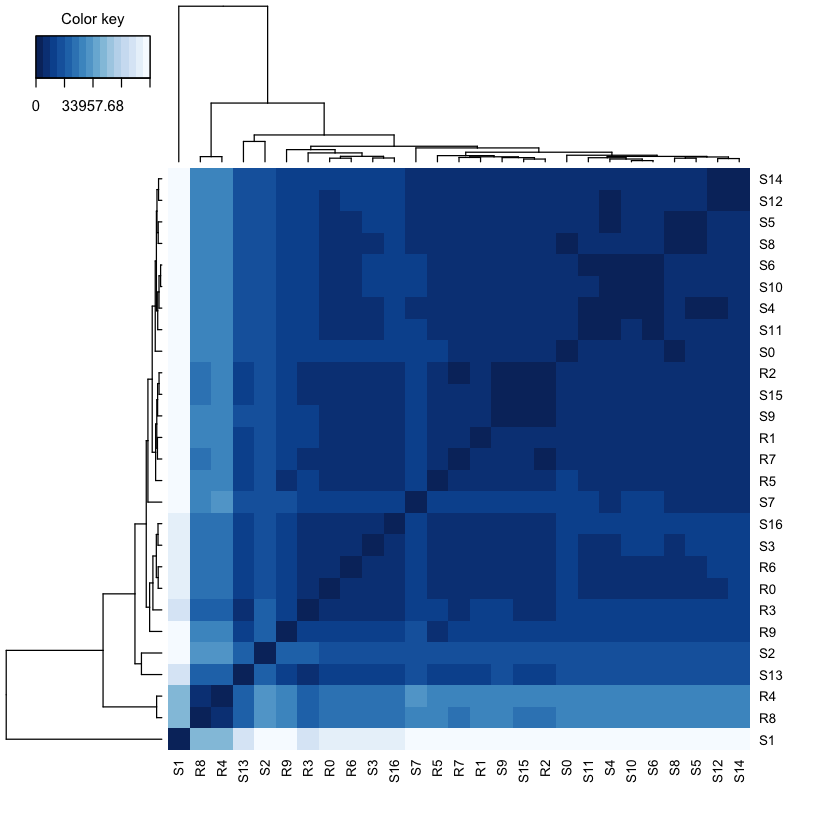

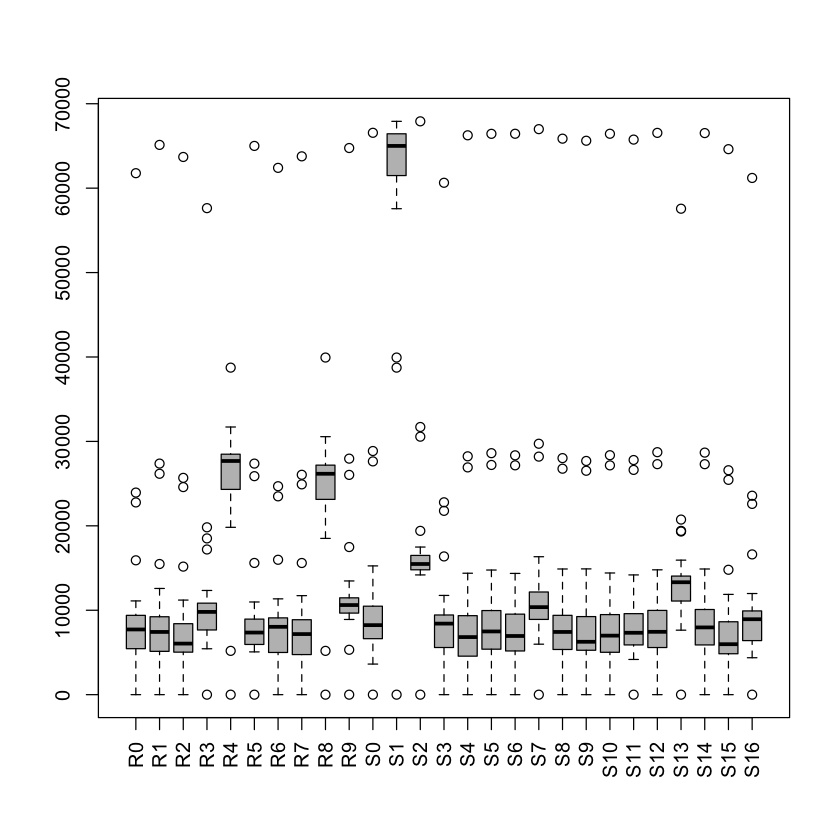

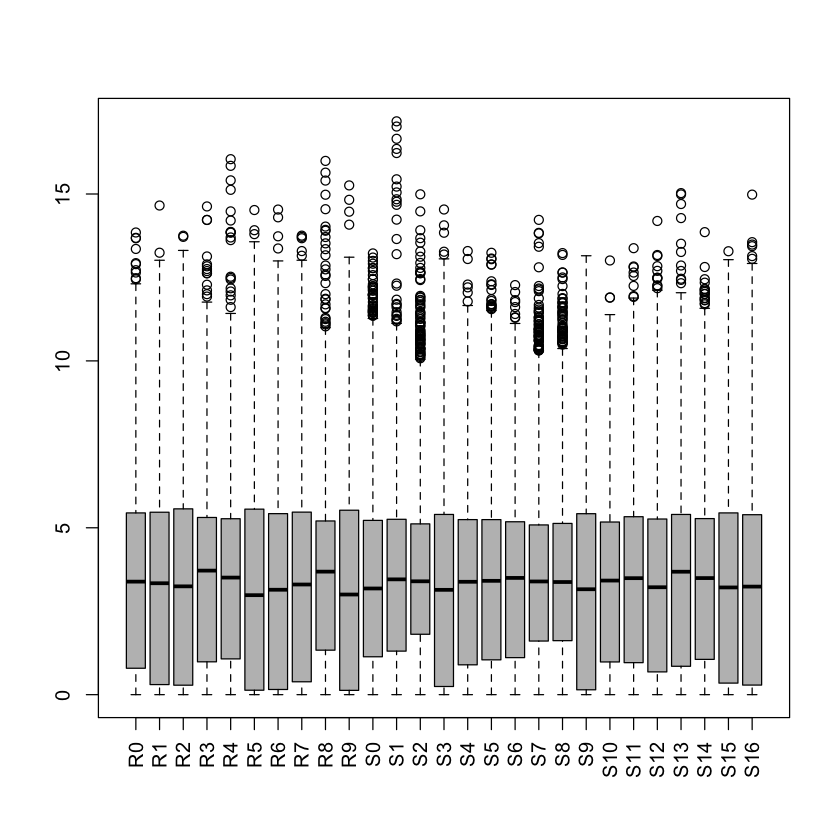

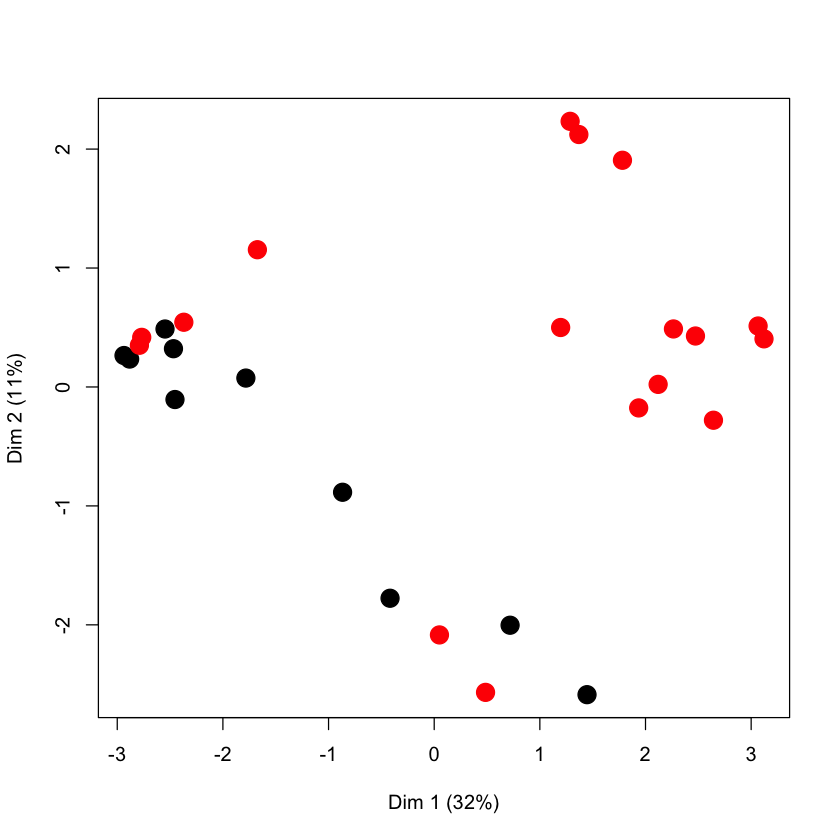

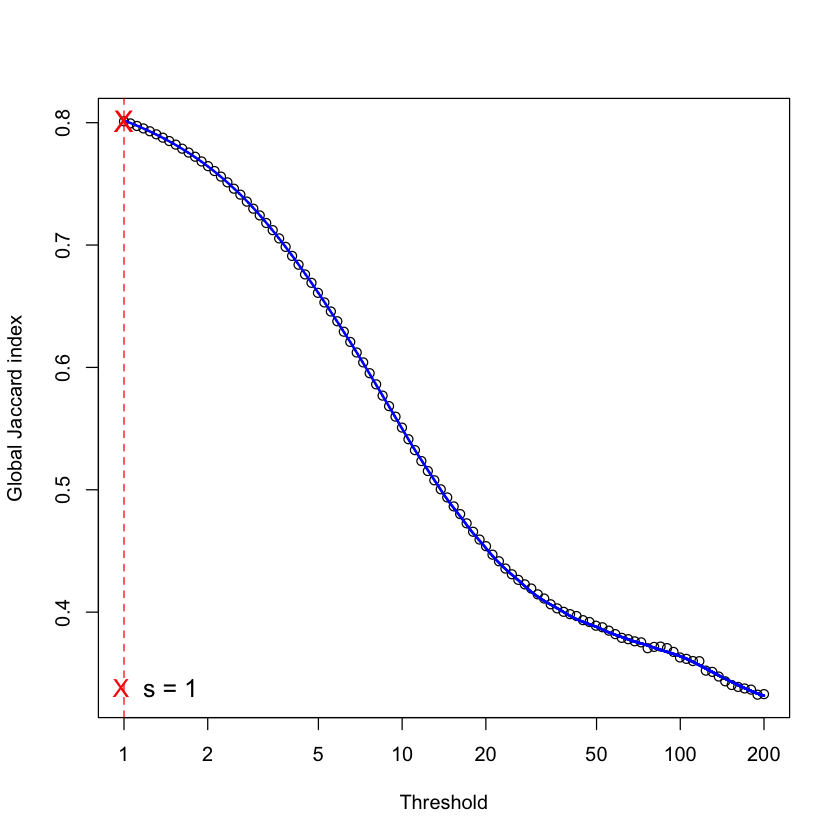

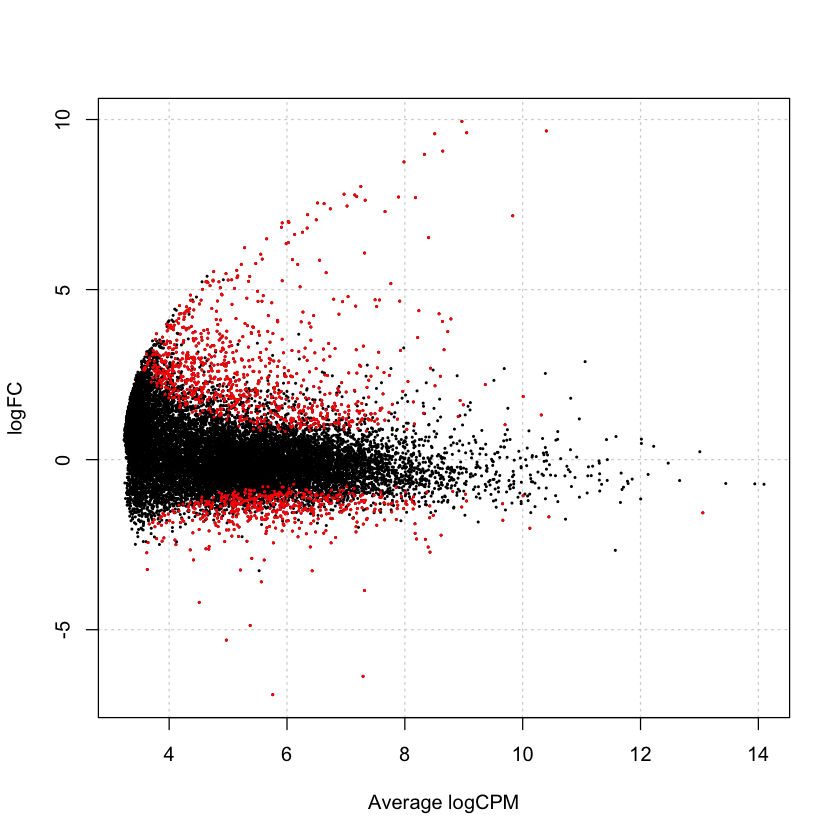

In [80]:
degR = edgeR(t(R1),t(S1),'RNASeq')

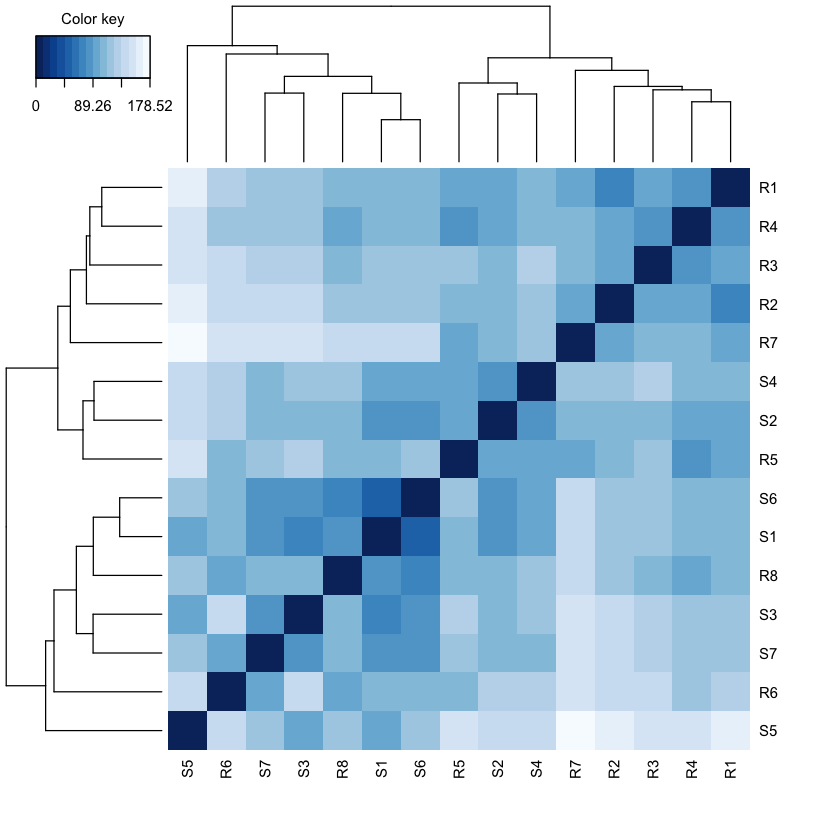

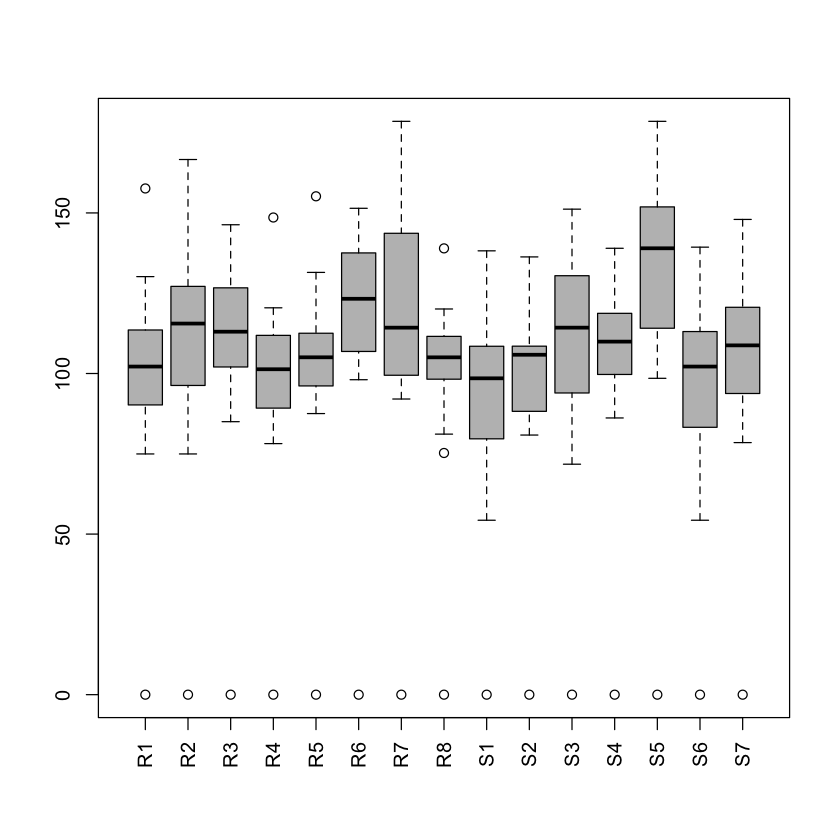

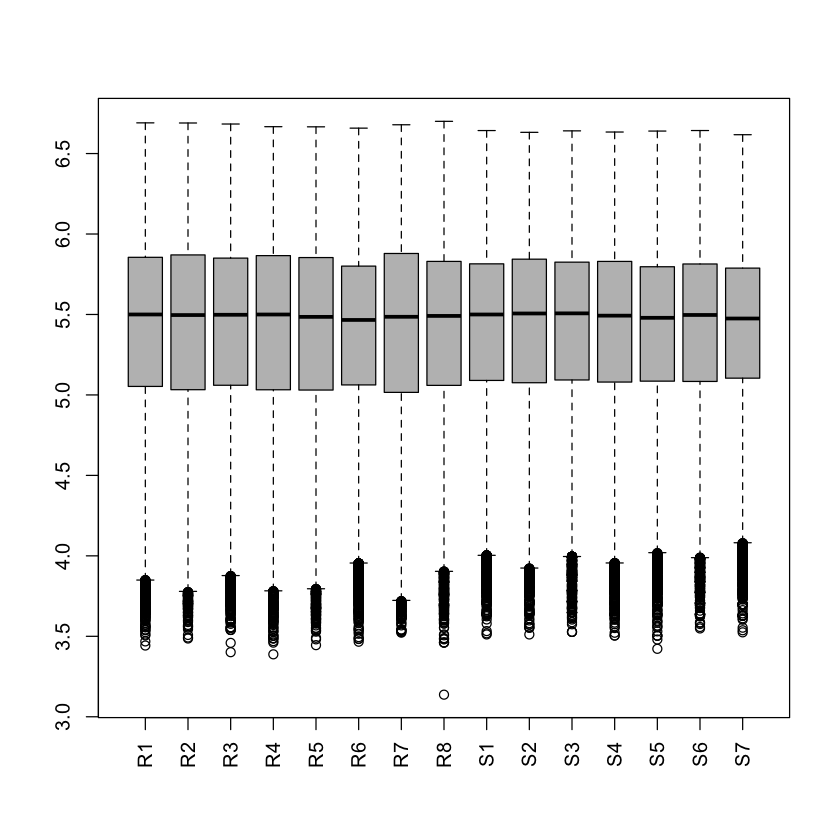

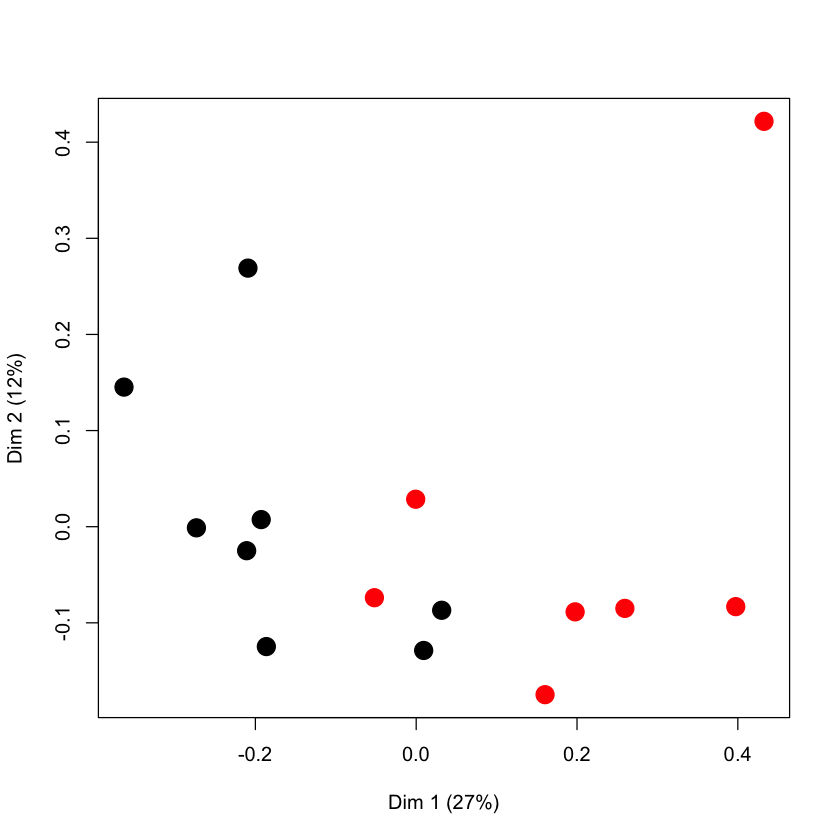

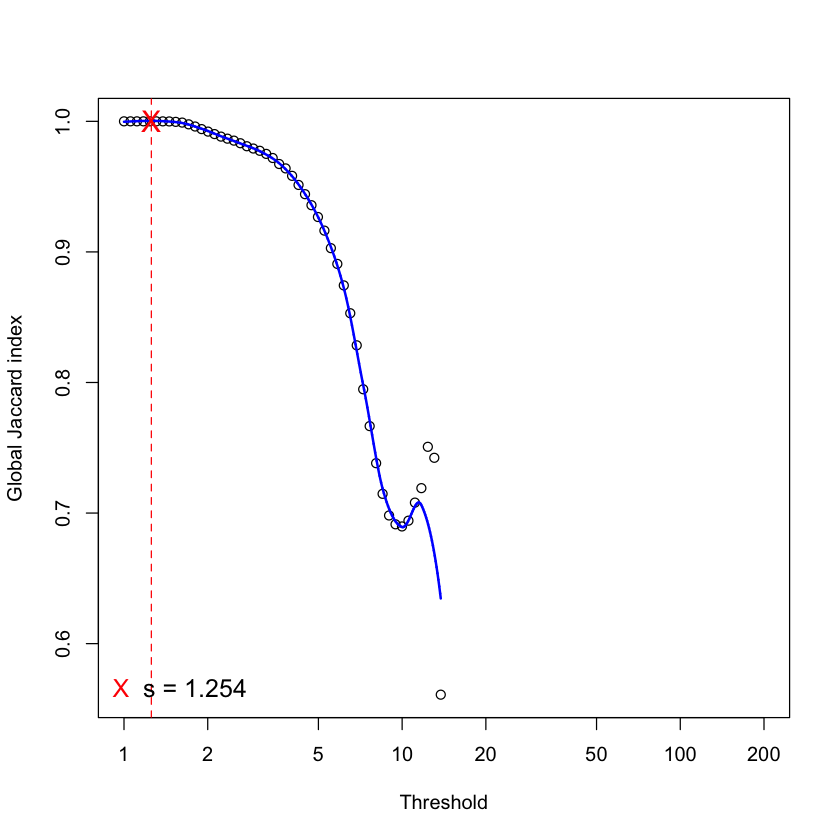

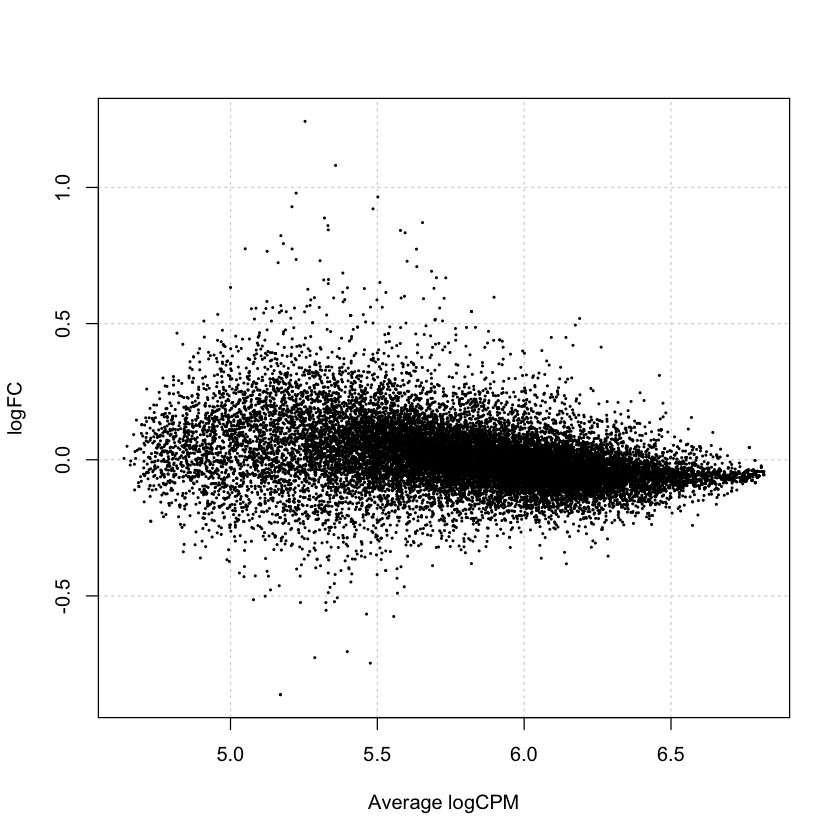

In [30]:
degR1 = edgeR(GSE69657,GSE69657_S,'RNASeq')

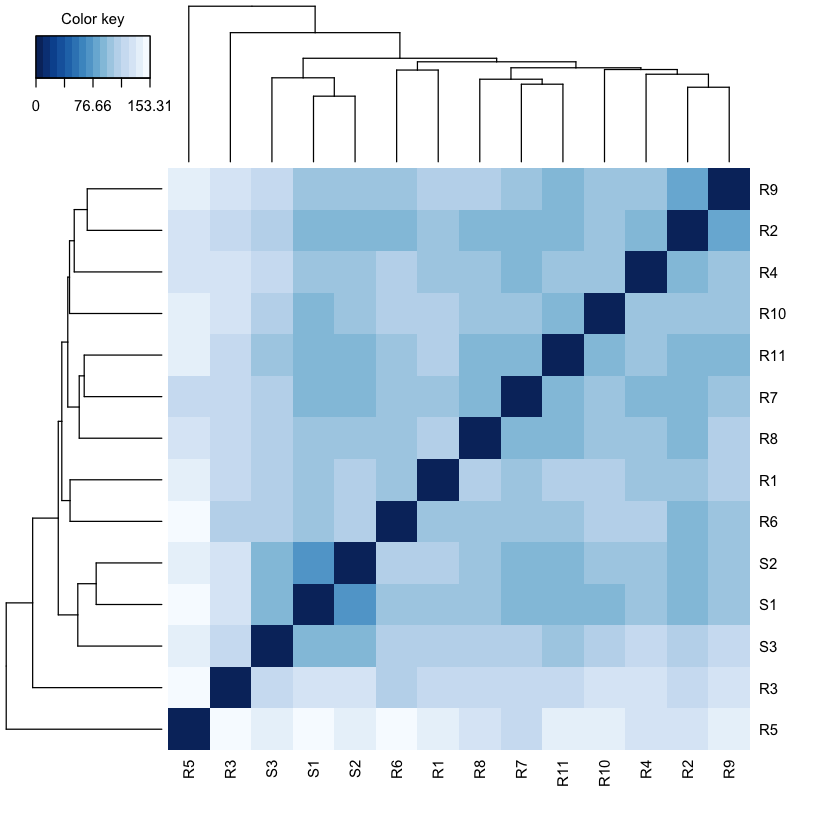

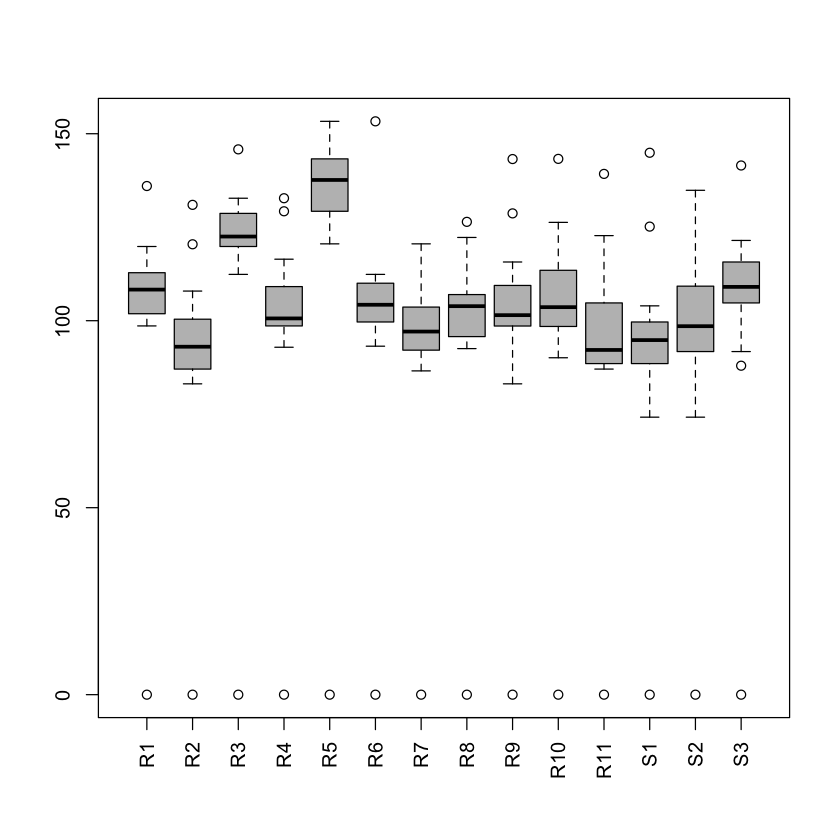

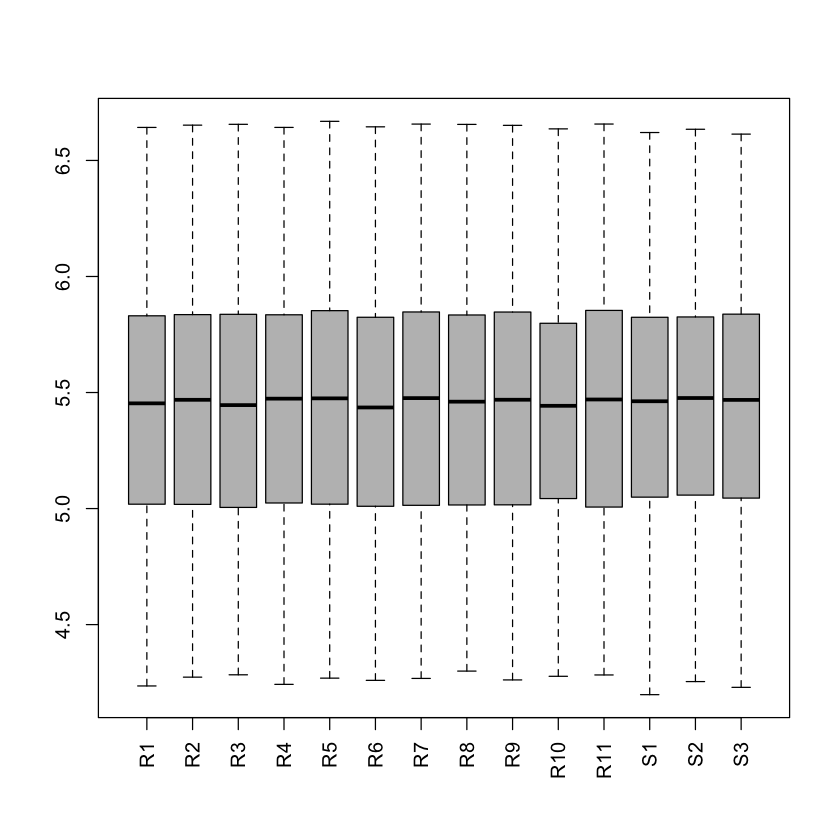

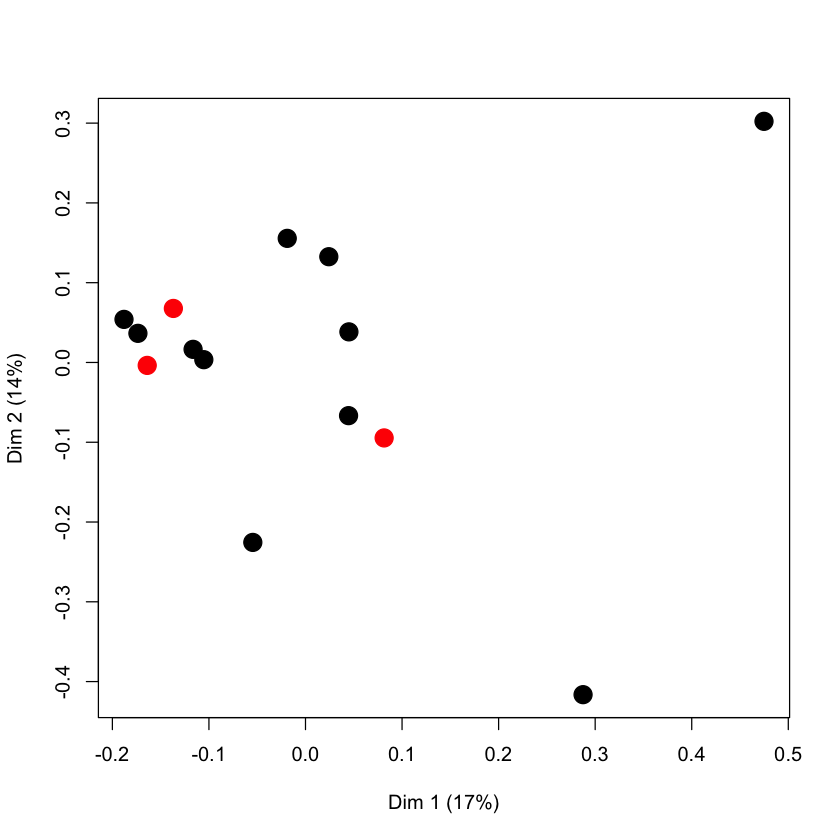

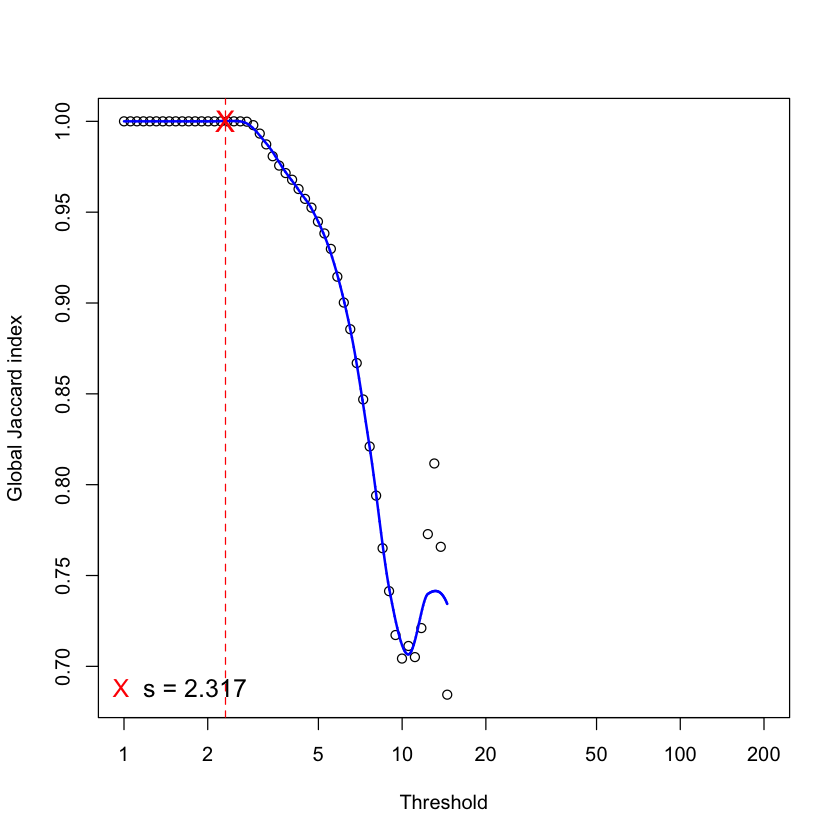

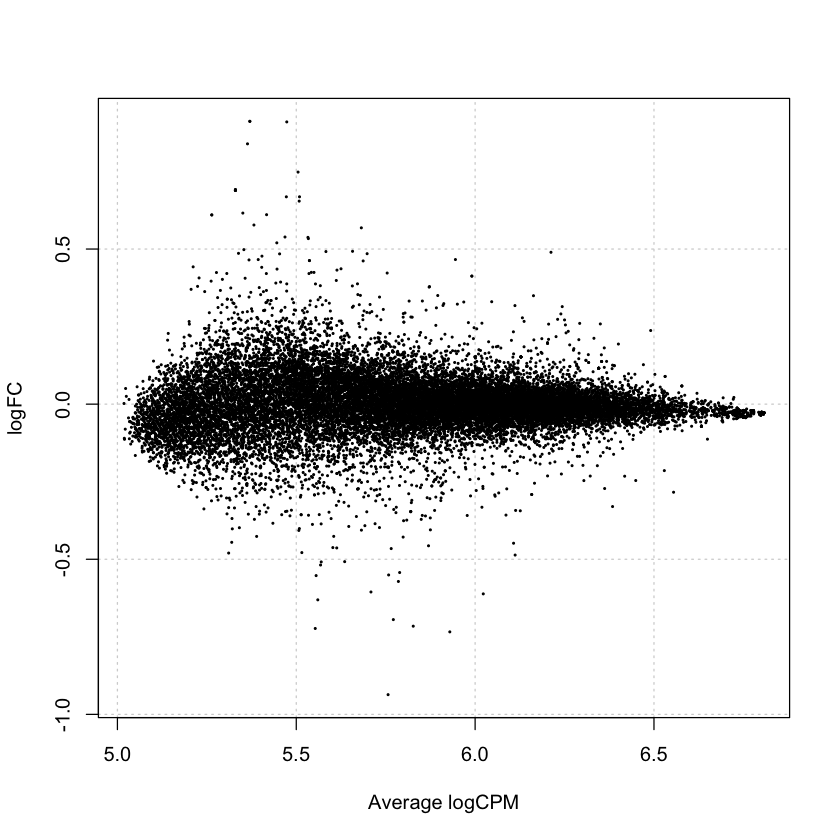

In [31]:
degR2 = edgeR(GSE19860,GSE19860_S,'RNASeq')

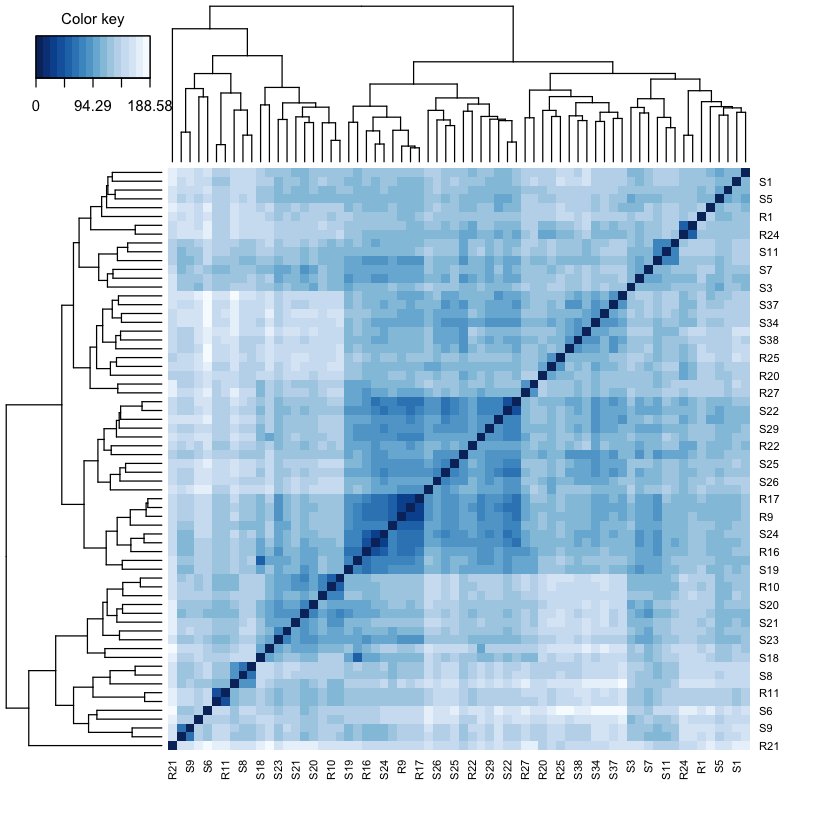

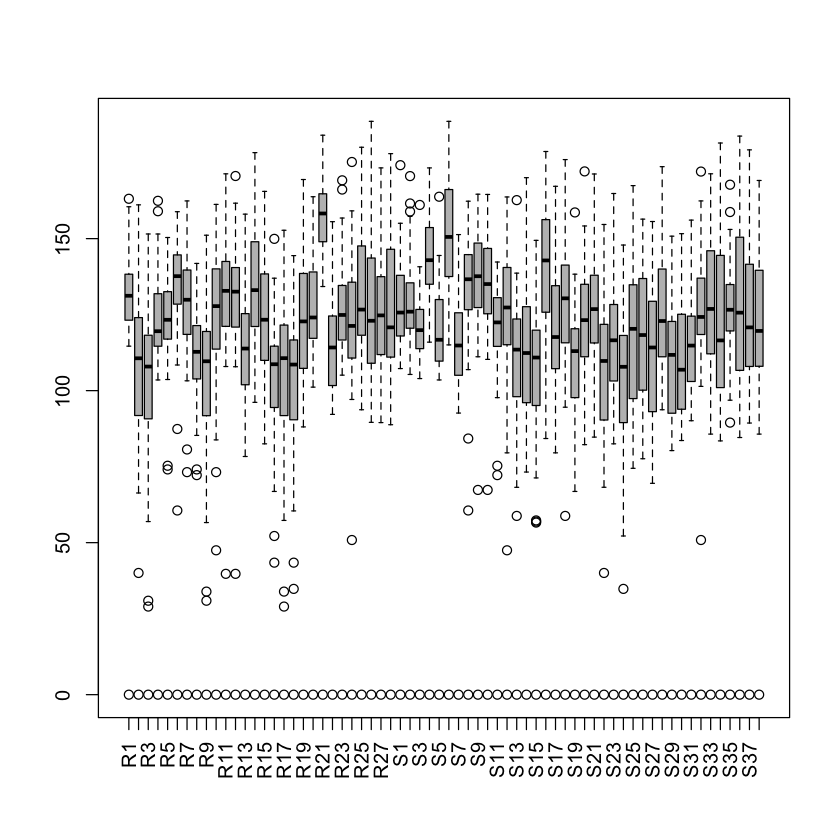

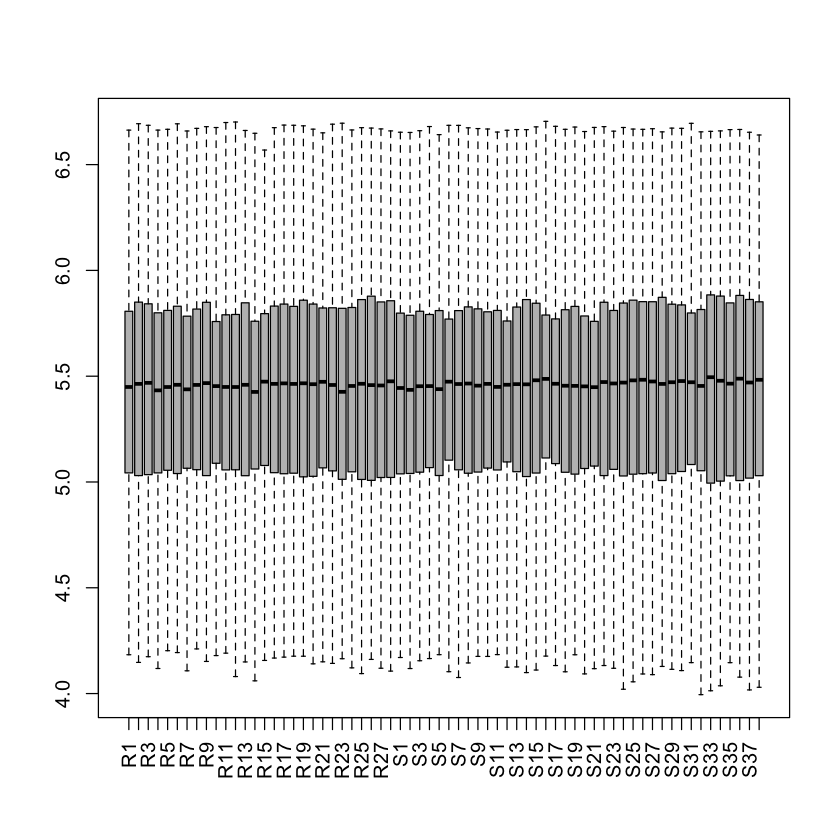

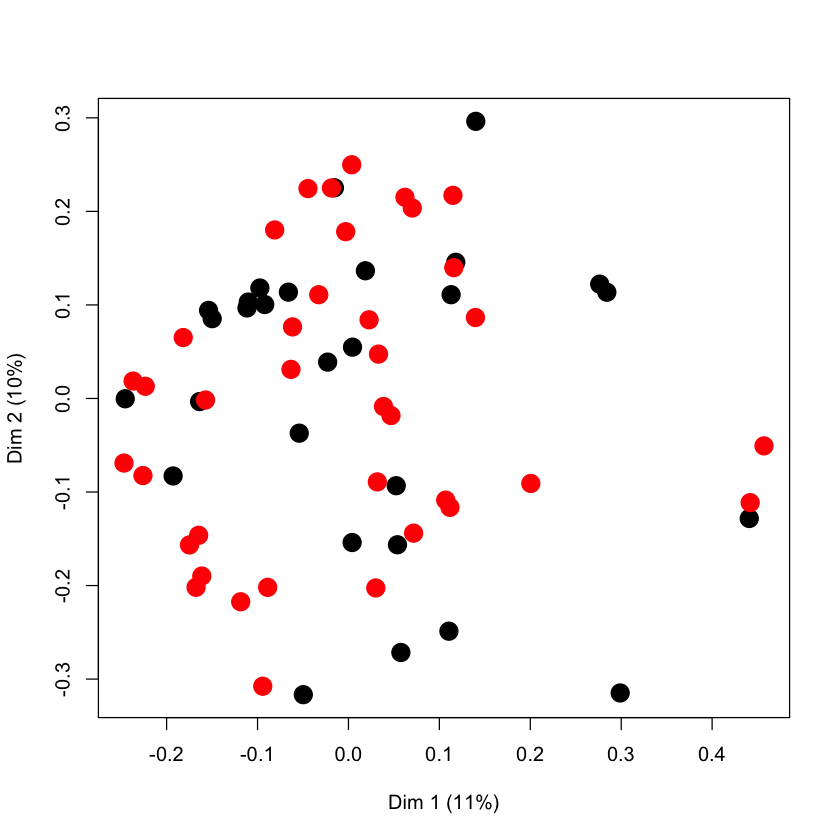

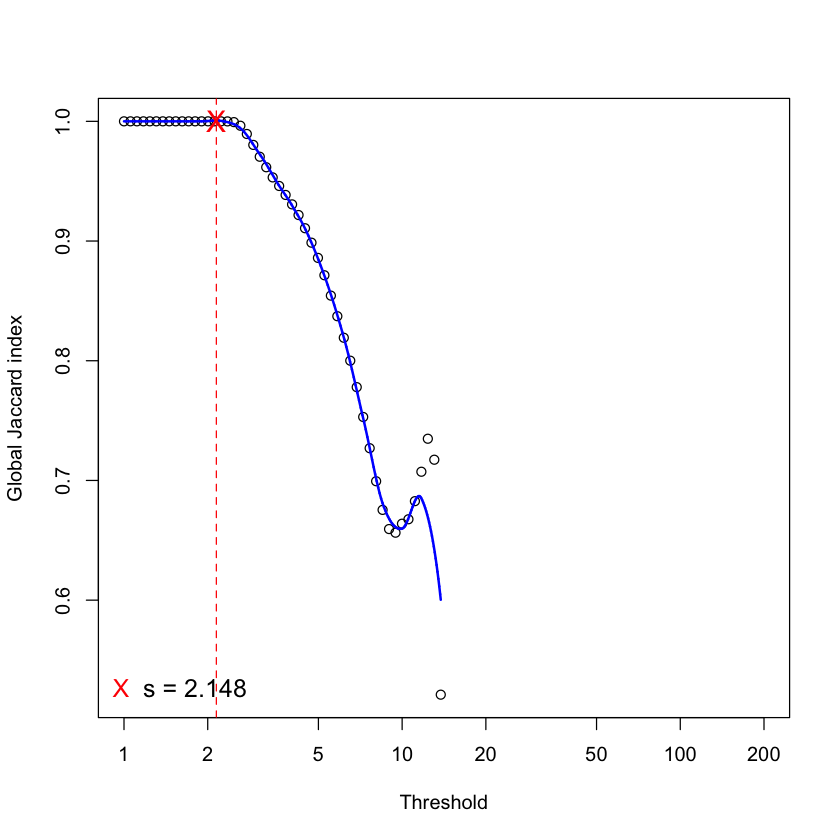

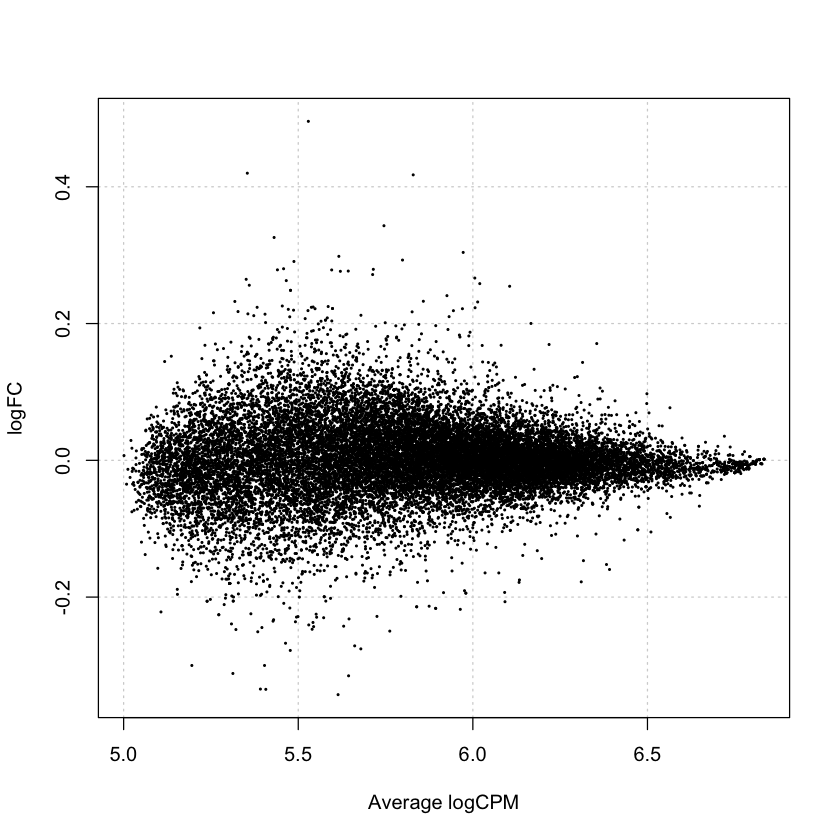

In [32]:
degR3 = edgeR(GSE72968,GSE72968_S,'RNASeq')

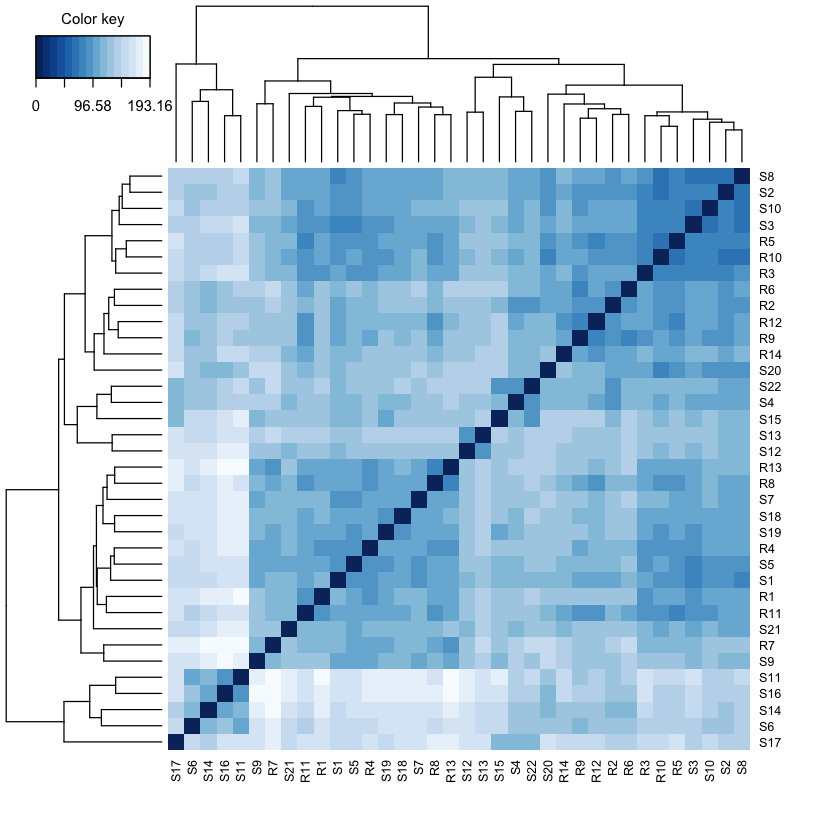

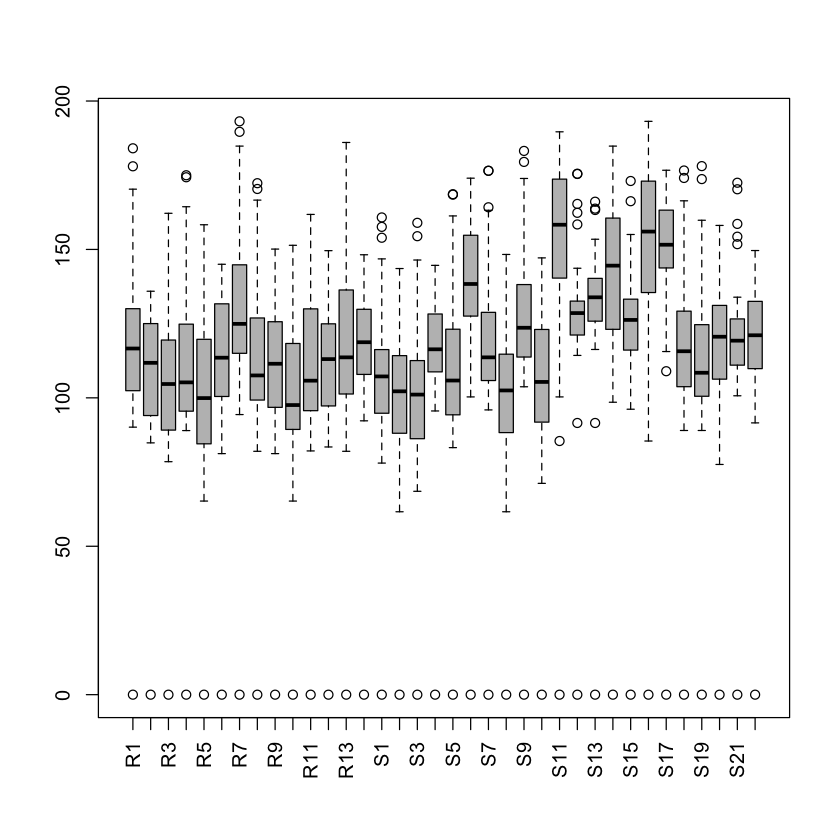

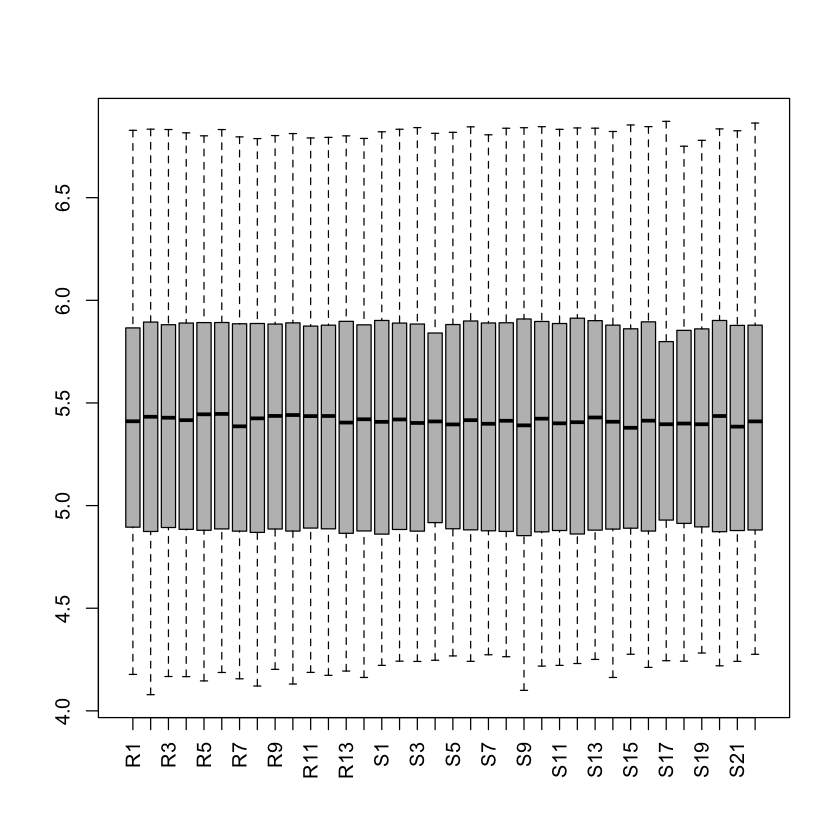

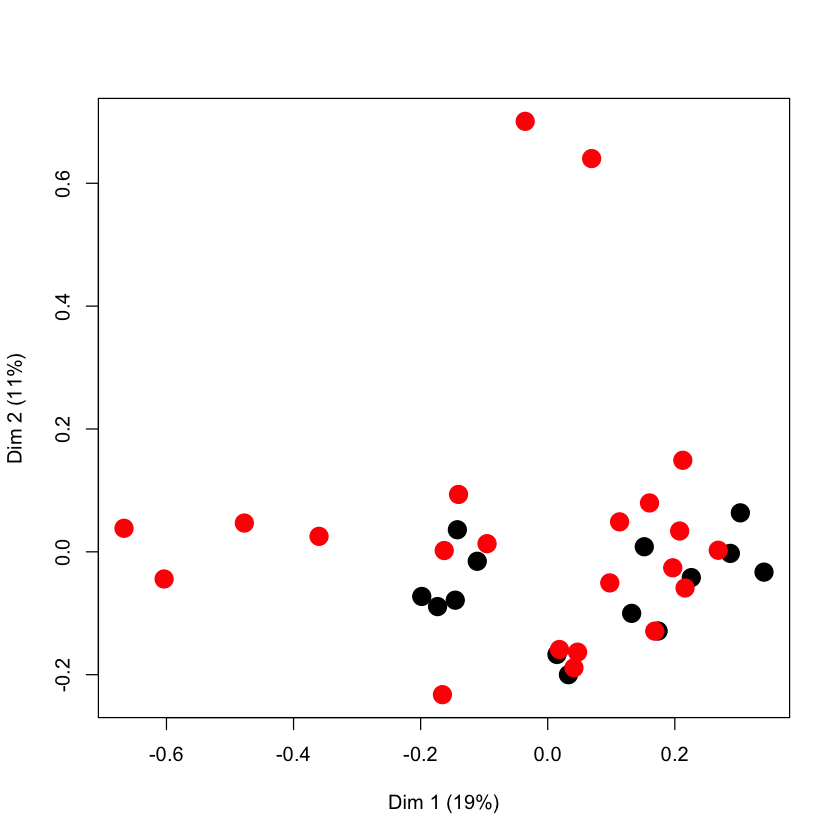

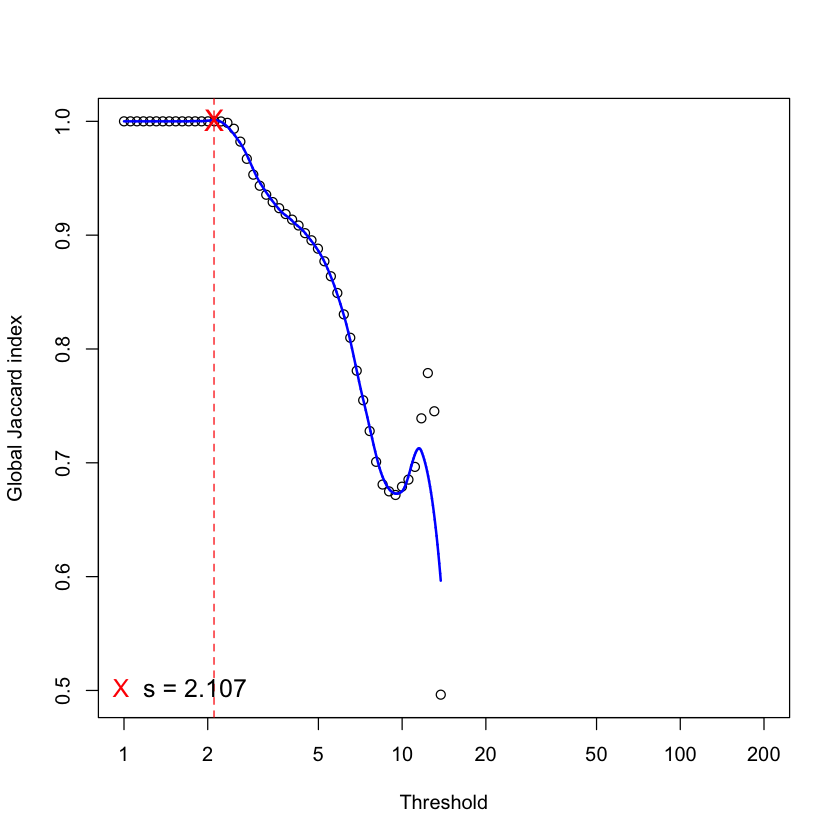

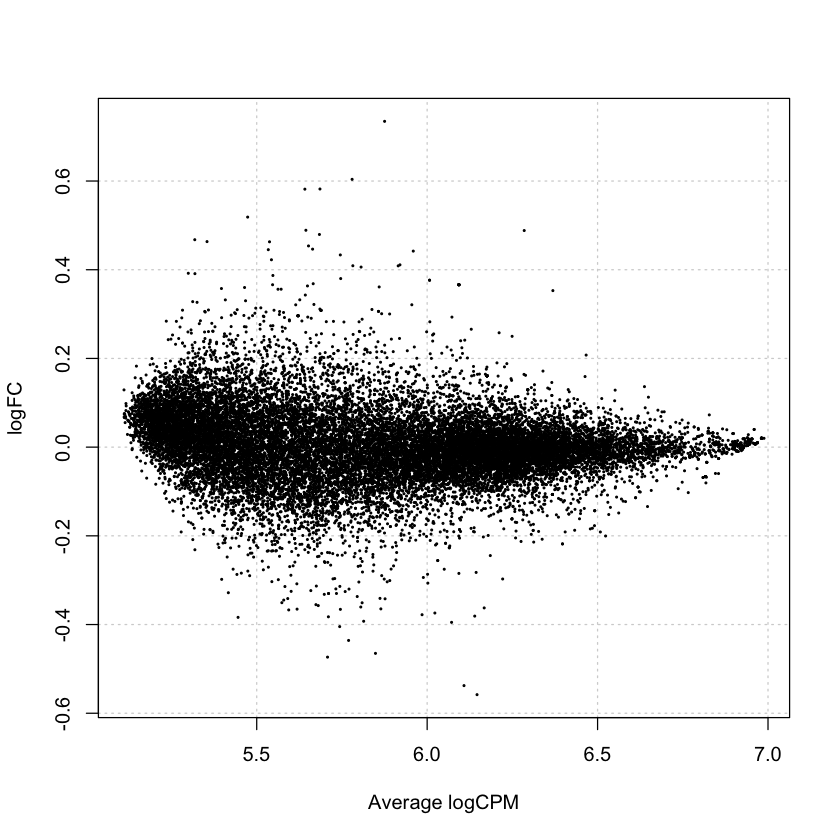

In [33]:
degR4 = edgeR(GSE52735,GSE52735_S,'RNASeq')

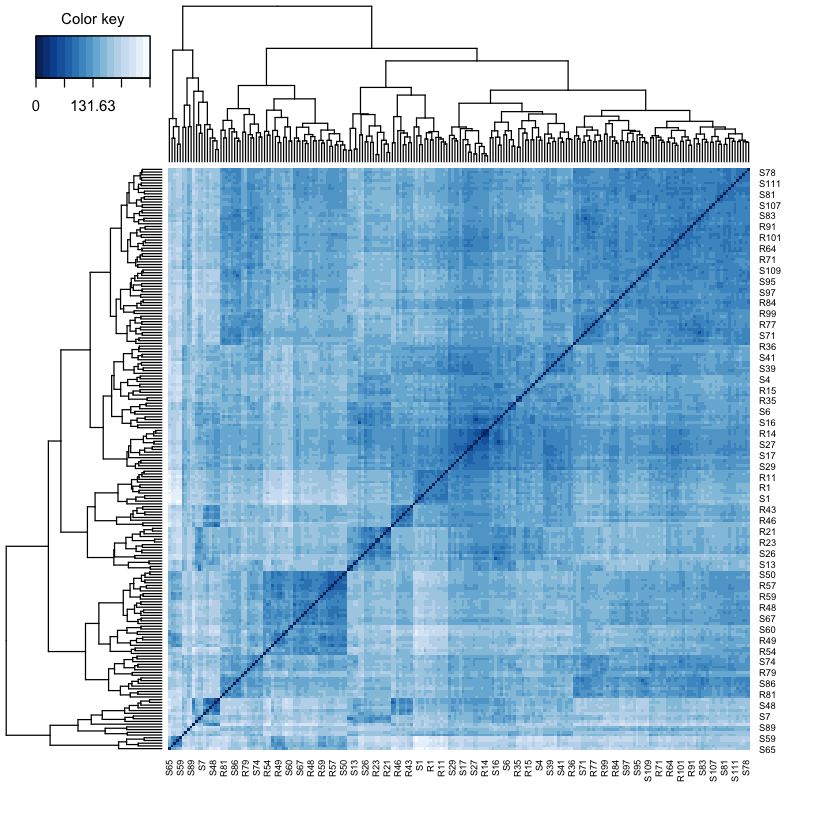

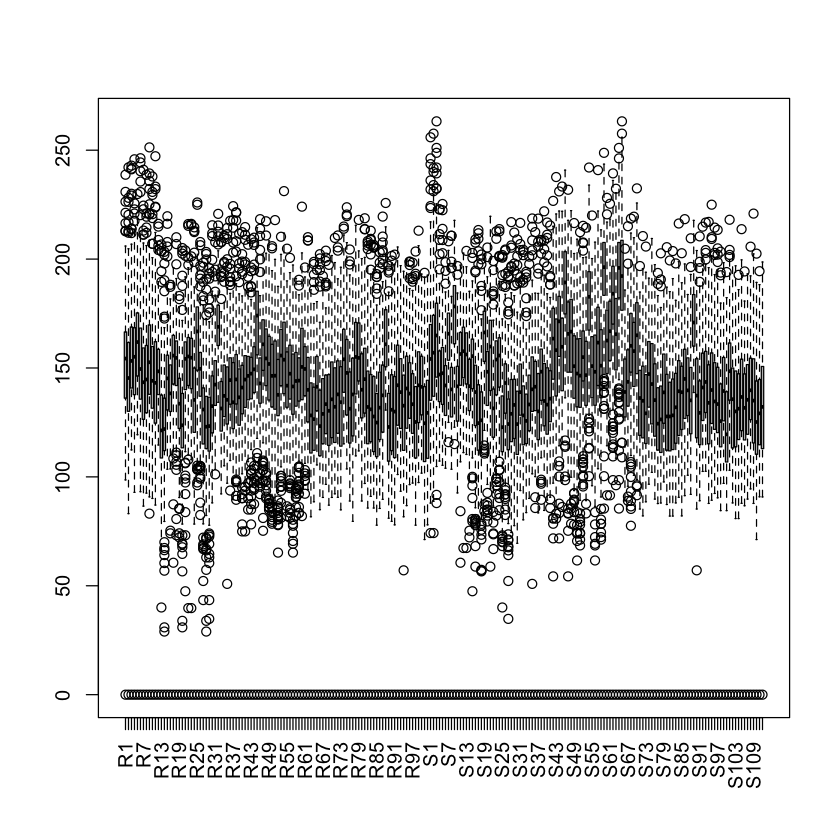

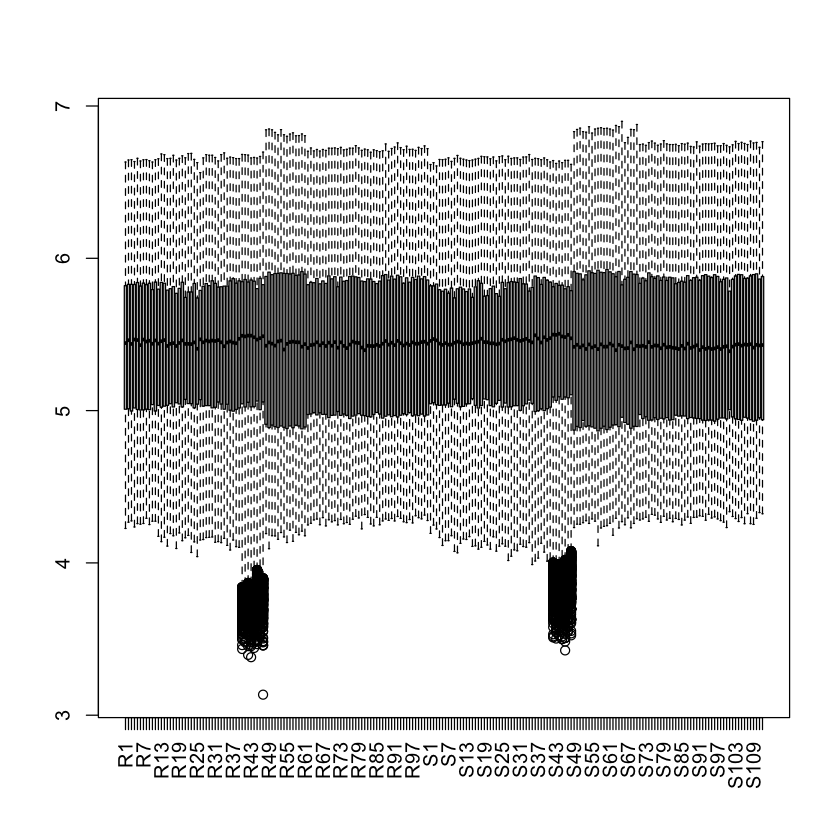

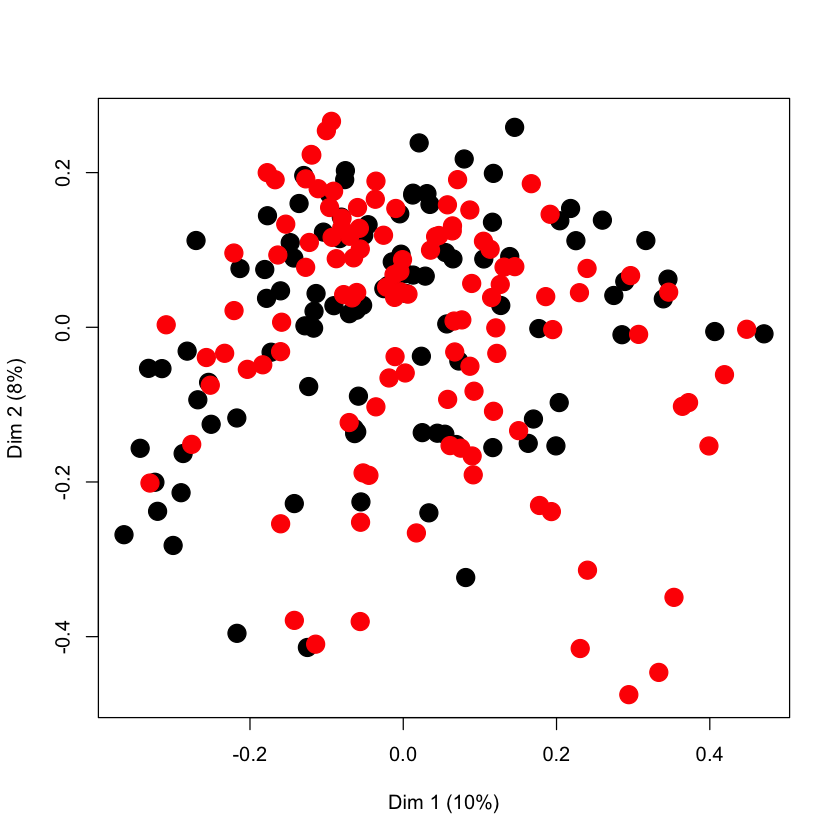

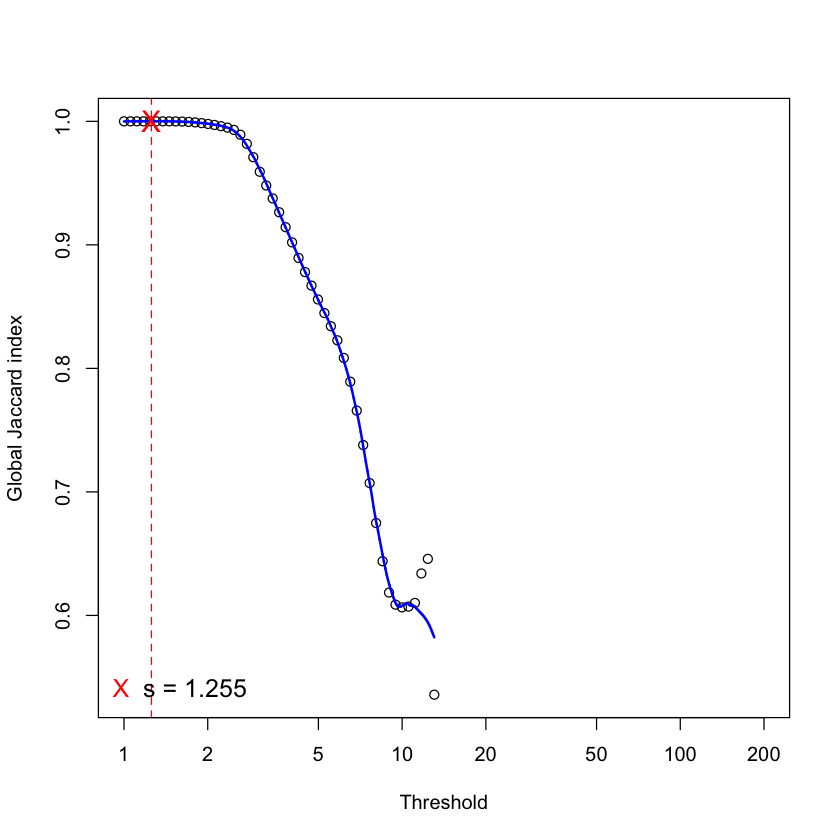

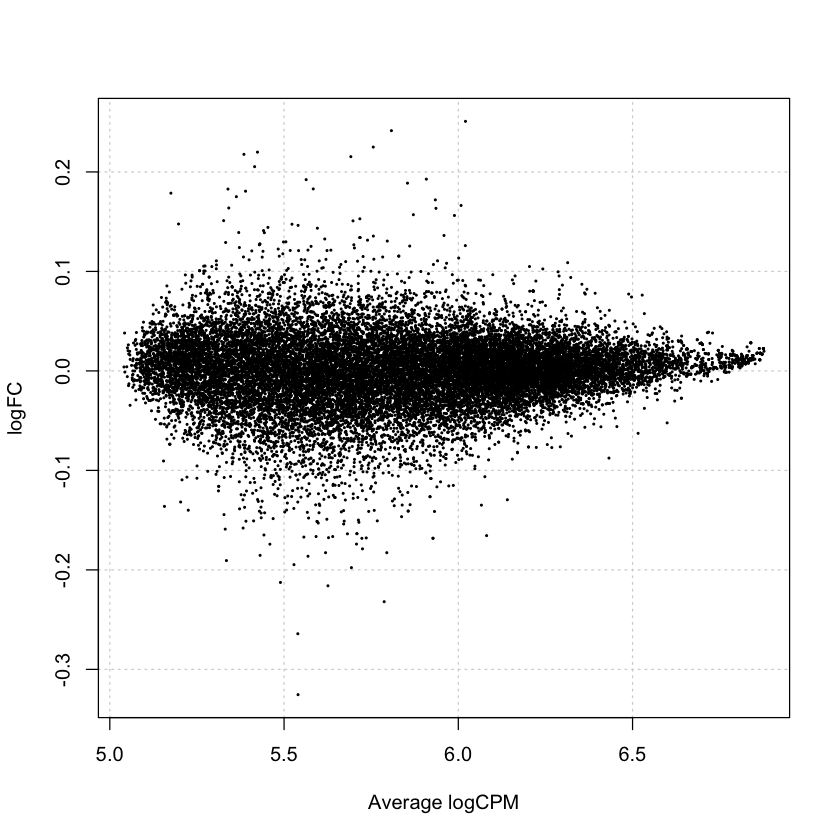

In [34]:
degR5 = edgeR(R,S,'RNASeq')

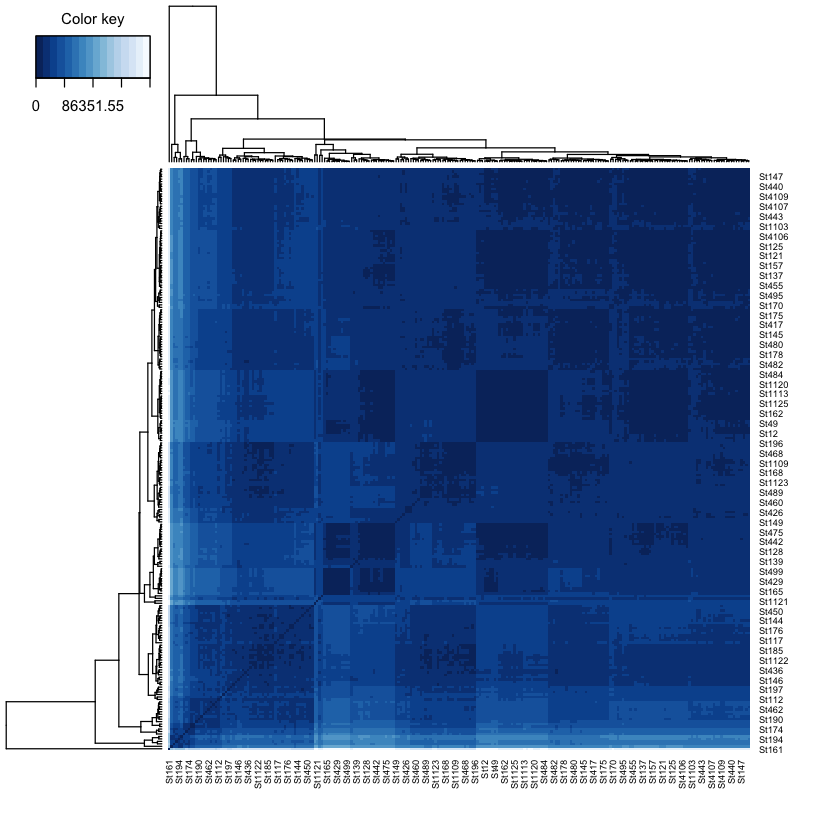

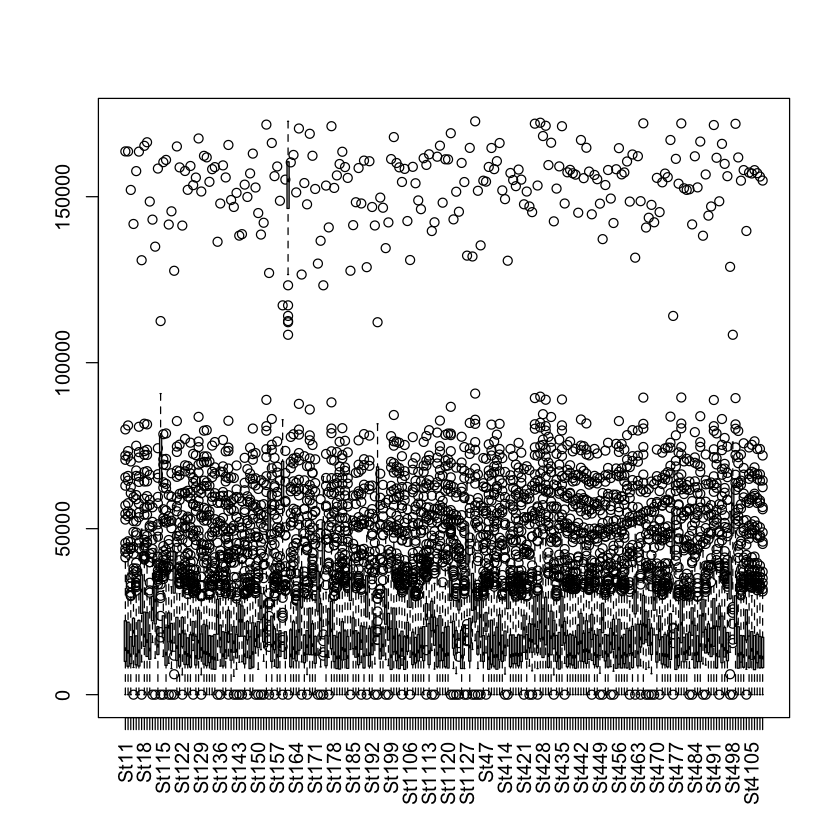

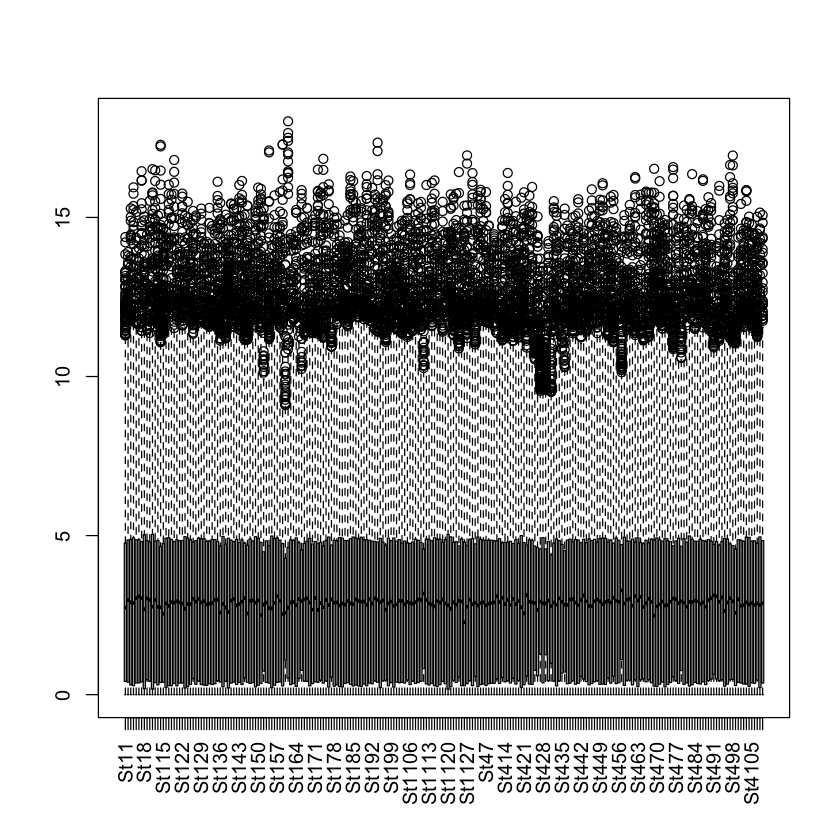

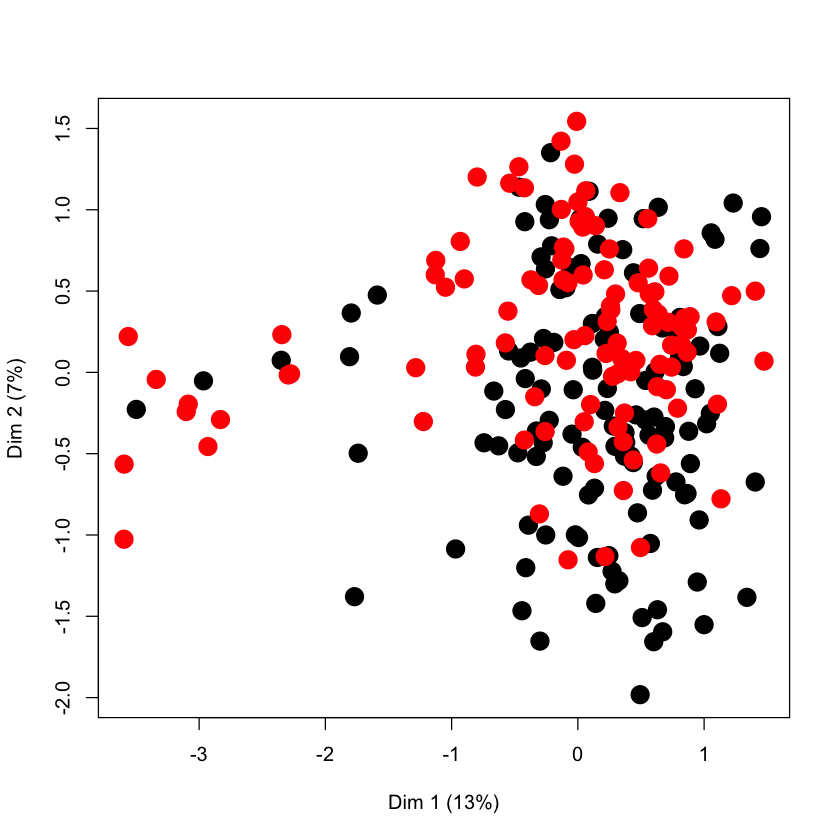

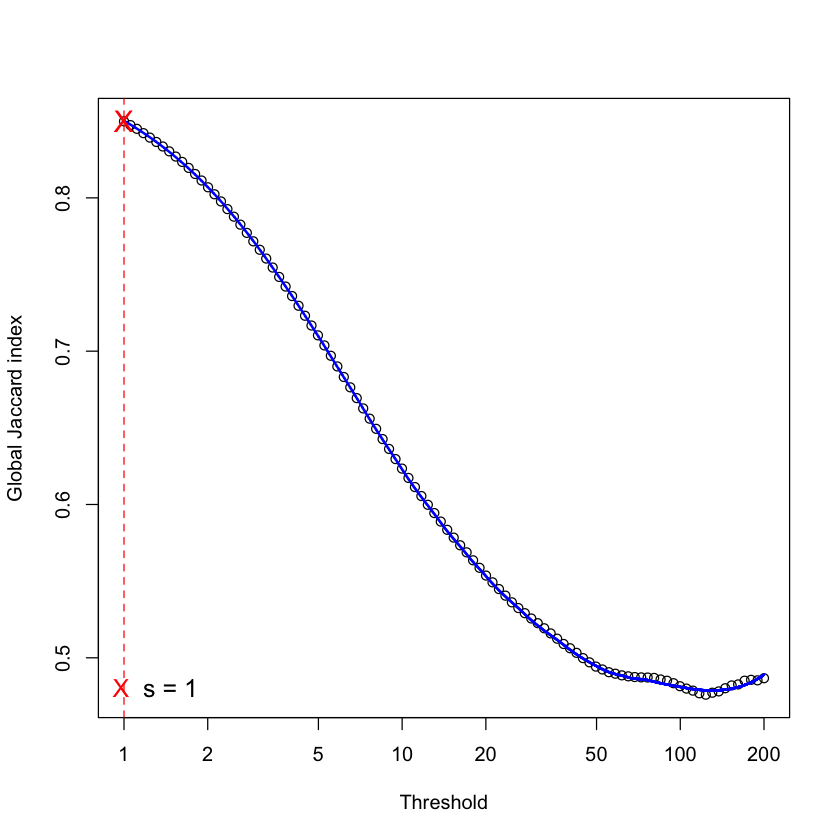

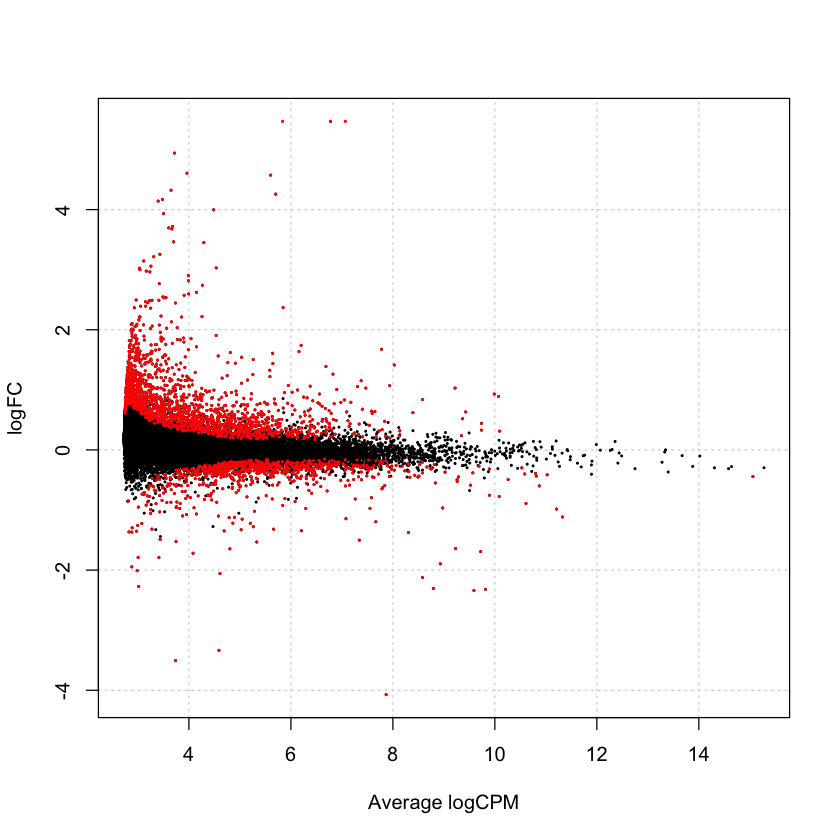

In [81]:
degstage14 = edgeR(t(stage1),t(stage4), 'stage4')

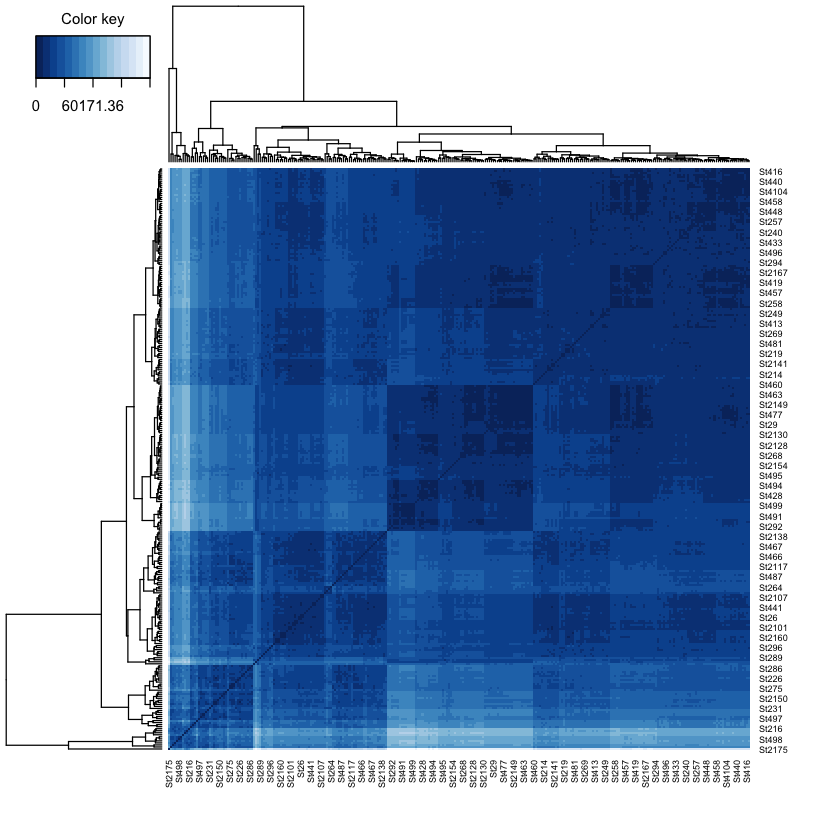

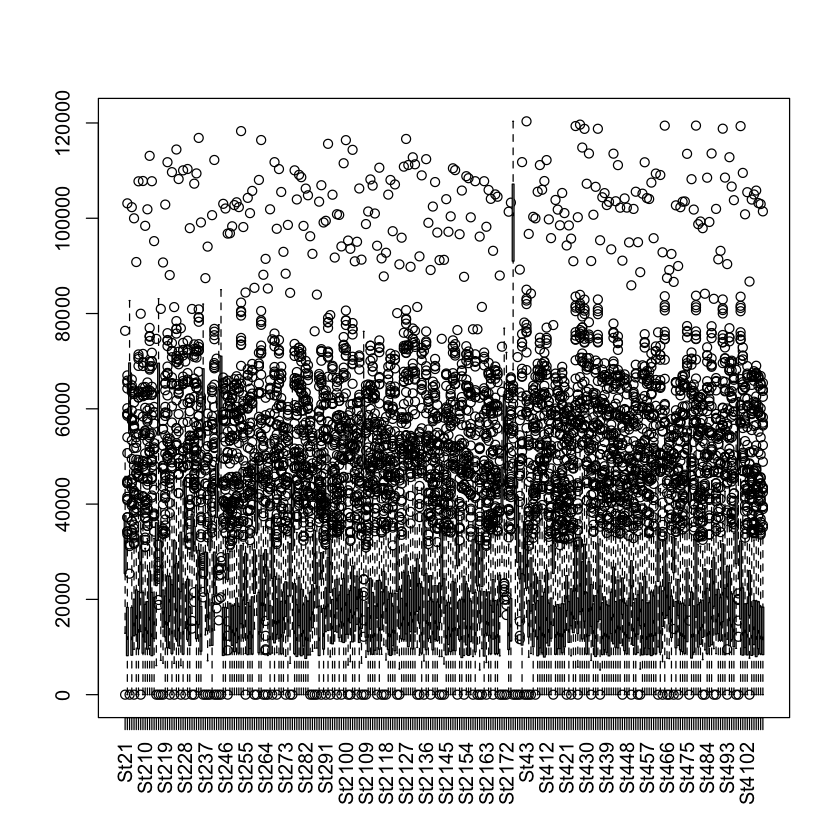

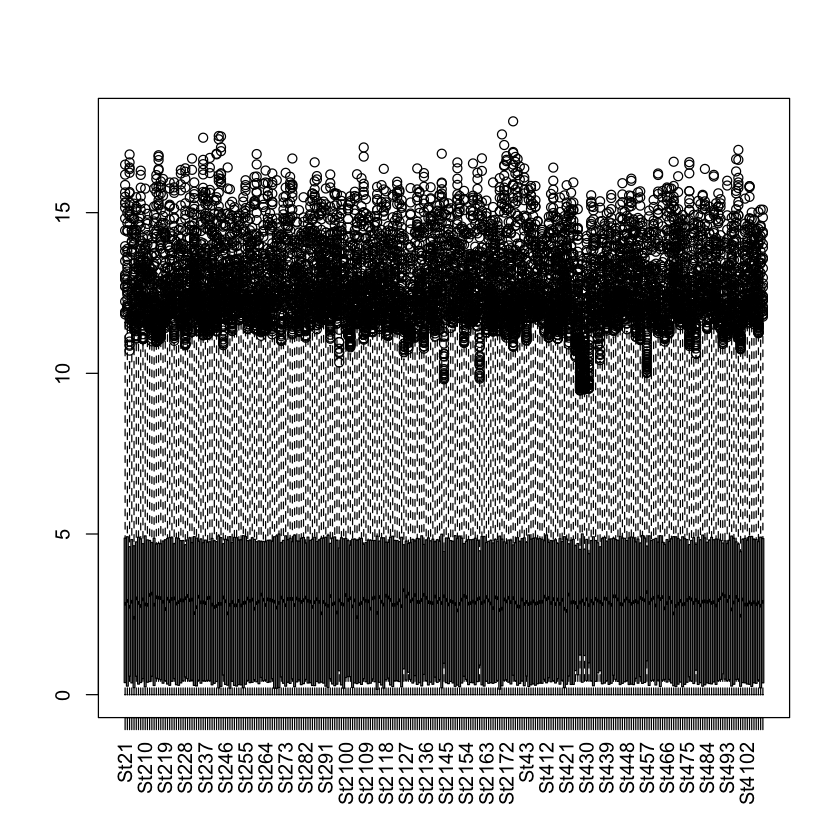

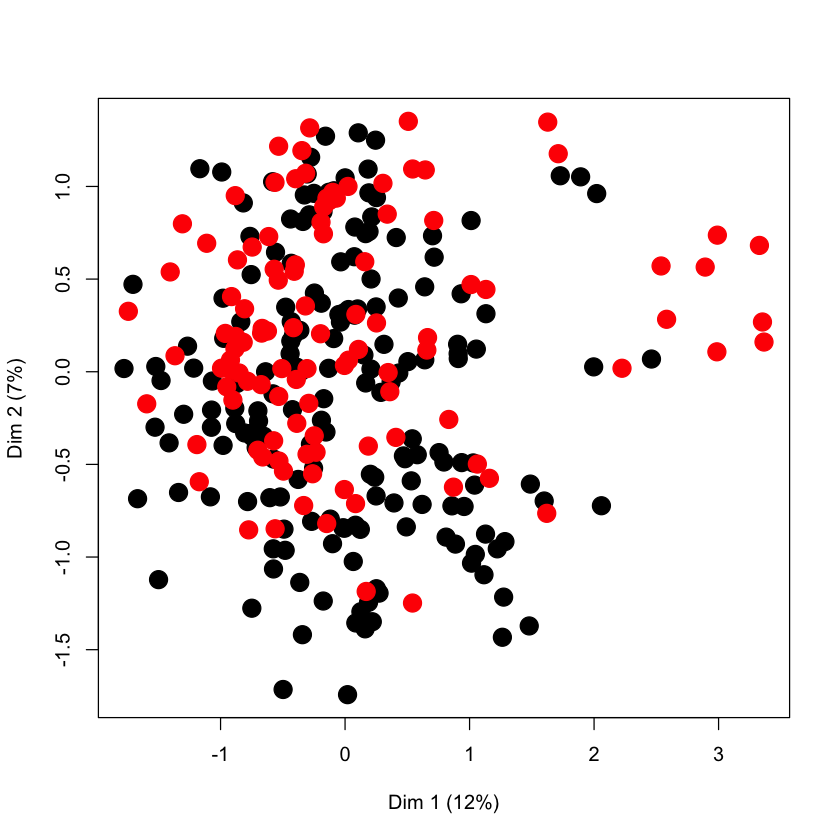

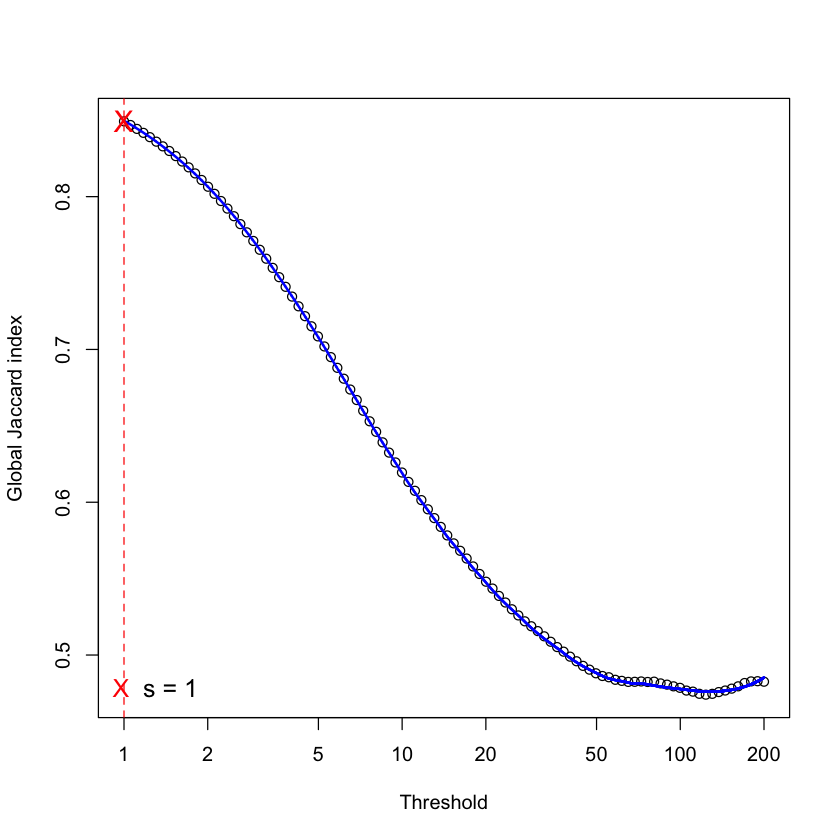

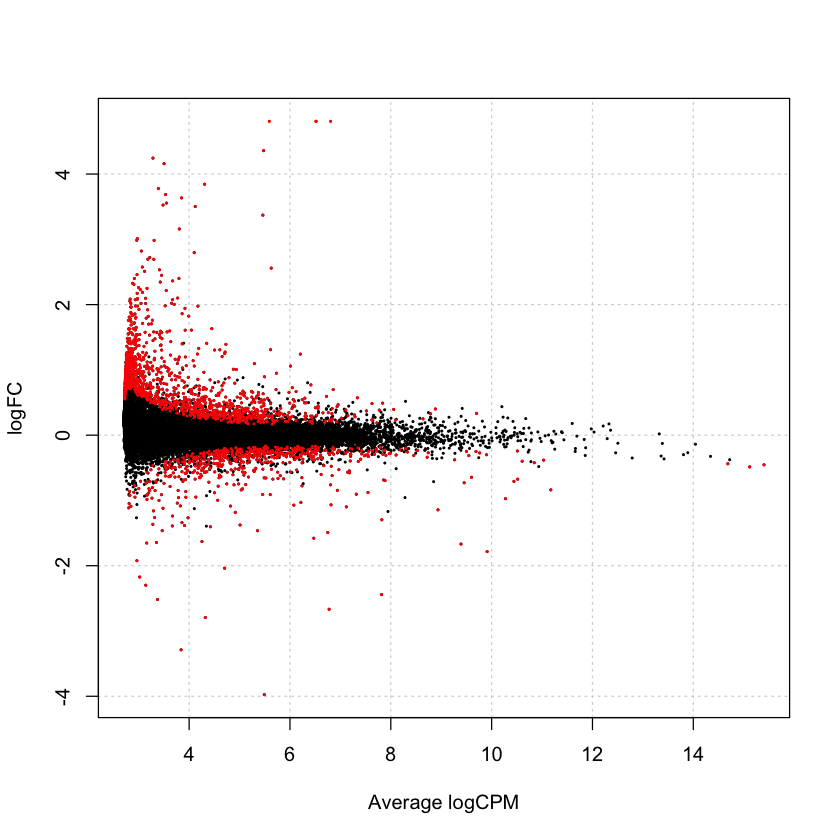

In [82]:
degstage23 = edgeR(t(stage23),t(stage4), 'stage23')

In [99]:
limma = function(df1, df2, name){
    
    library(limma)
    library(data.table)
    library(dplyr)
    library(EnhancedVolcano)
    
    design = model.matrix(~ 0 + factor(c(rep(1, ncol(df1)), rep(2, ncol(df2)))))
    colnames(design) = c('R', 'S')
    
    dataset = cbind(df1, df2) 
    #dataset = normalizeBetweenArrays(dataset, method="quantile")
    
    fit = lmFit(dataset, design, method='ls') 
    
    contr = makeContrasts(R - S, levels = colnames(coef(fit)))
    tmp = contrasts.fit(fit, contr)
    
    fit2 = eBayes(tmp, robust=TRUE) 
    
    plotSA(fit2, main="Gene-level")
        
    results = decideTests(fit2, method='hierarchical', adjust.method='BH', p.value=0.05)
    sig = topTable(fit2, n=Inf, adjust='BH', coef=1, sort.by='P', p.value=0.05)
    
    vennDiagram(results, include=c("up","down"), counts.col=c("red", "blue"))
    volcanoplot(fit2, coef=1, names = fit2$genes$Gene.symbol)
    
    limma::plotMA(fit2, coef=1, main="R vs S")
    abline(h=0, col="red", lwd=2)
    
    up = subset(sig, logFC > 0)
    
    #write.csv(up, paste('/Users/lebohangmashatola/Downloads/CRCPhenotypePredictionTool-main/Results/', name, 'DEG.csv', sep=''))
    
    up = df1[rownames(up) , ]
    return(up)

}

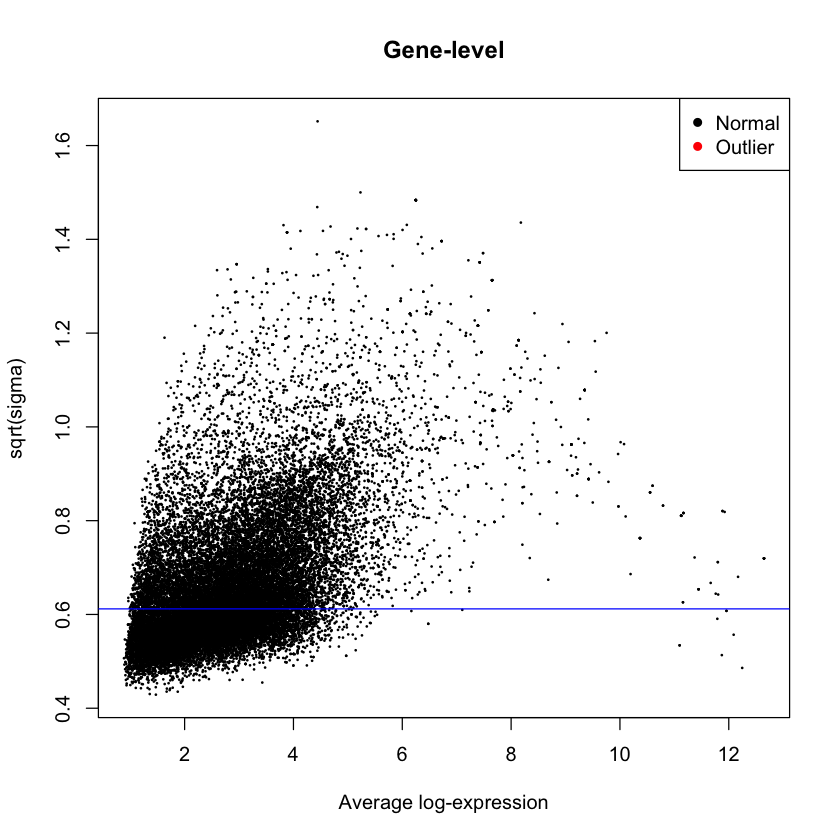

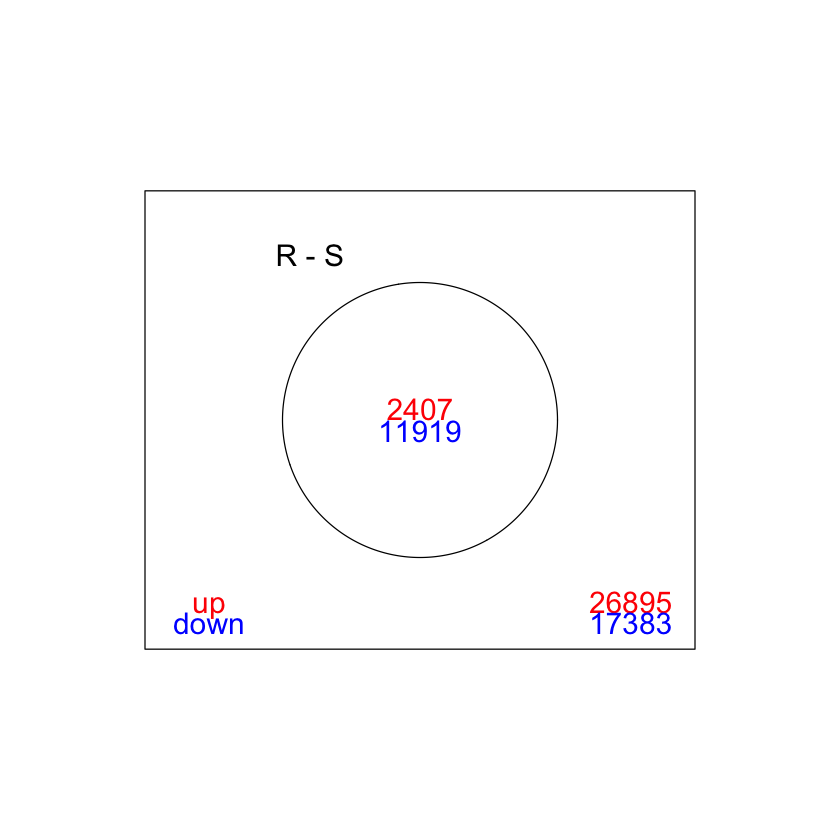

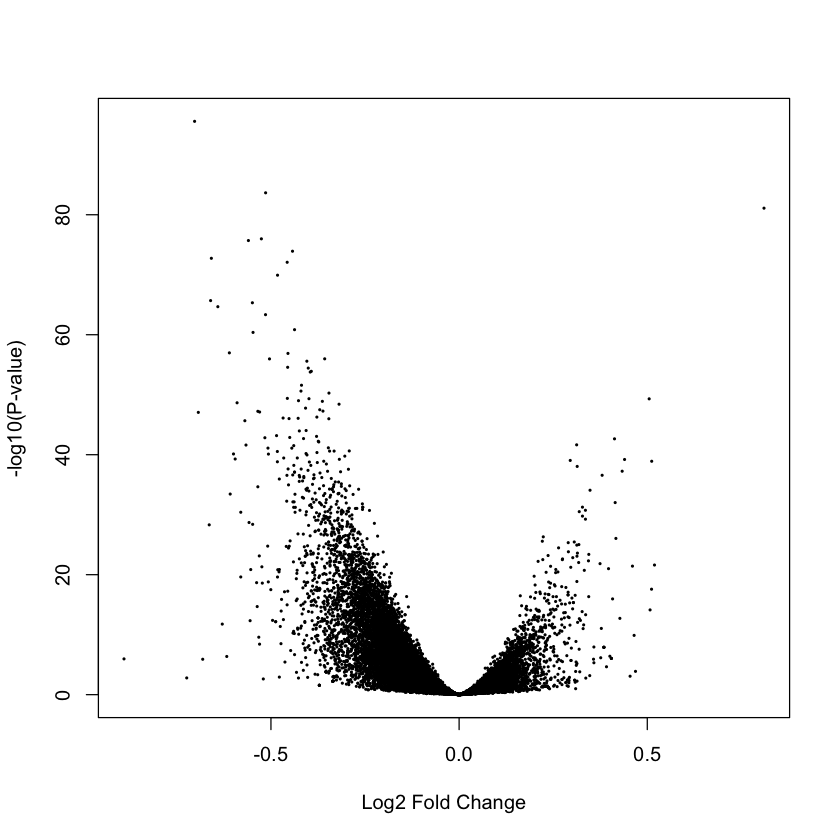

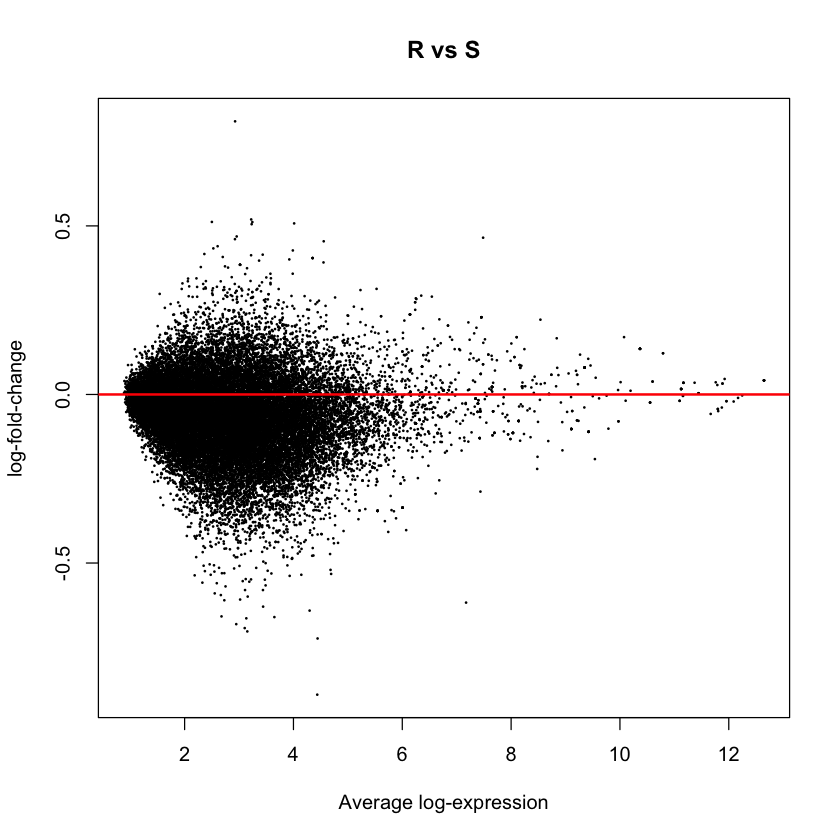

In [100]:
deg_GSE81653 = limma(GSE81653, GSE81653_S, 'GSE81653')

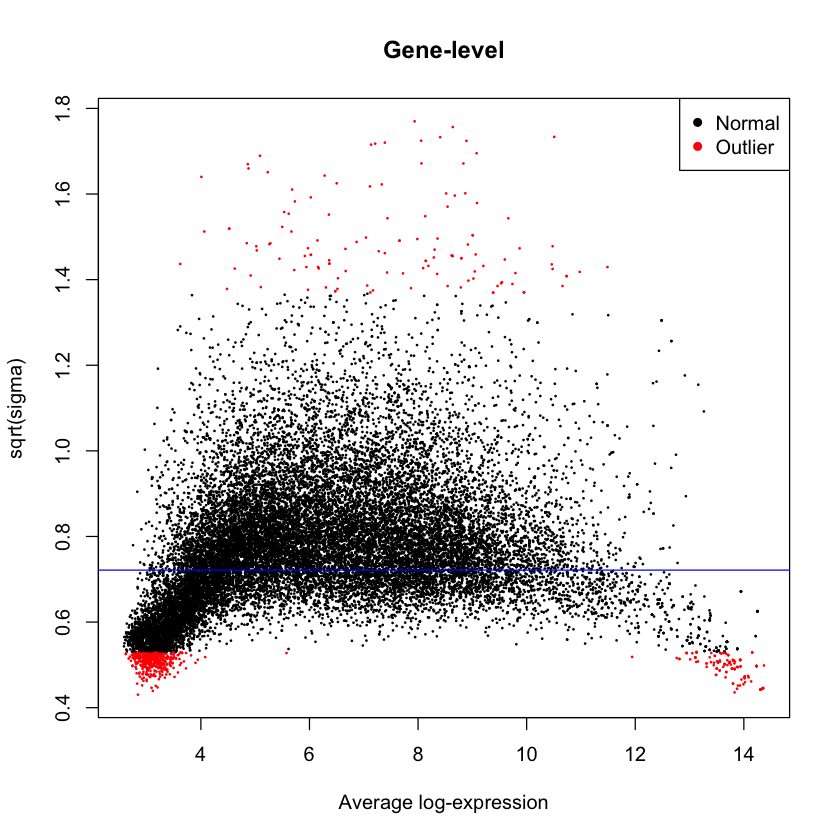

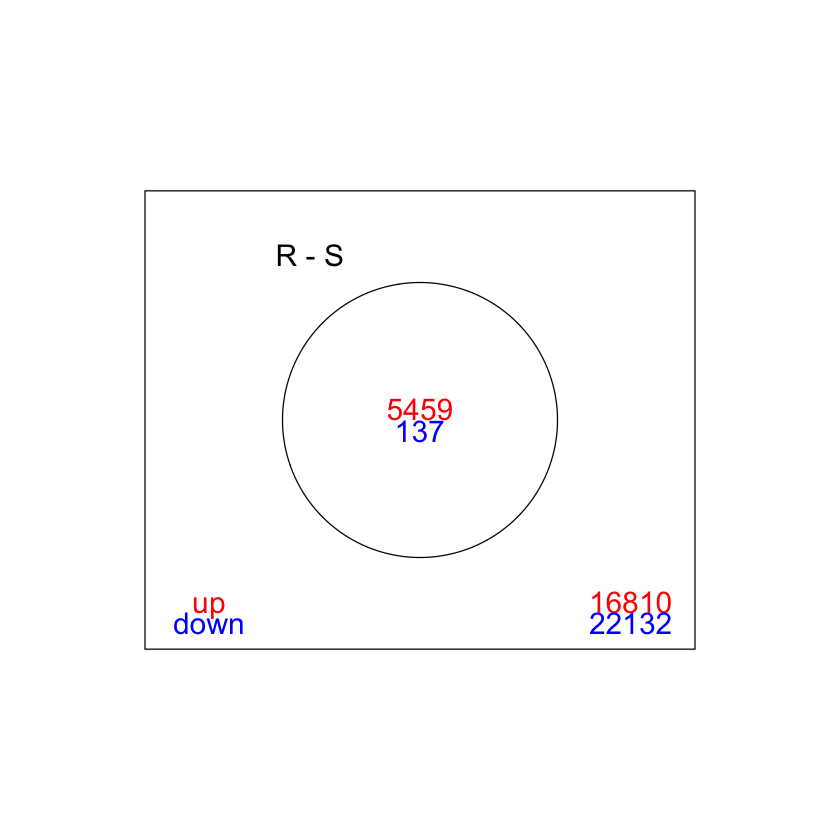

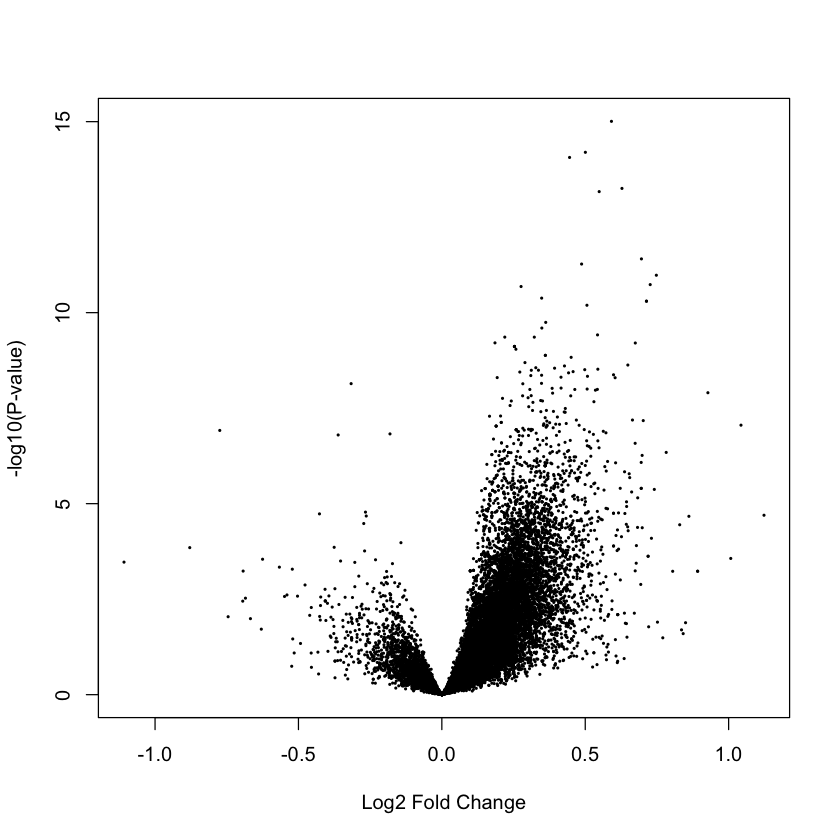

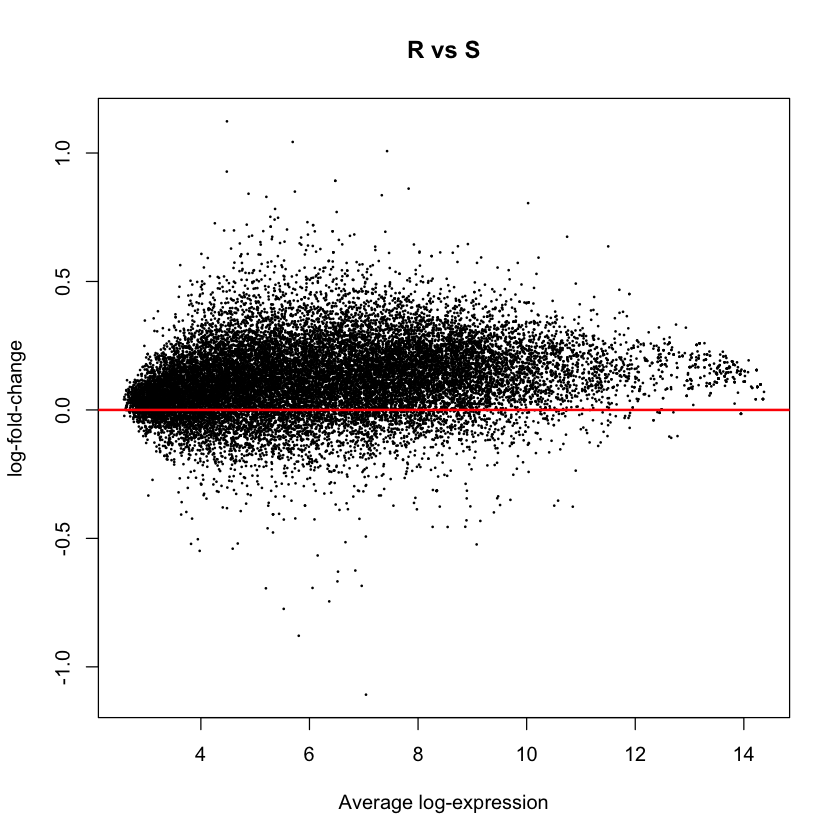

In [102]:
deg_array = limma(R,S, 'array')

In [103]:
power = function(dataset){

  library(WGCNA)

  enableWGCNAThreads(nThreads=32)
  allowWGCNAThreads()
  options(stringsAsFactors = FALSE)

  dataset = t(dataset)

  powers = c(c(1:10), seq(from = 12, to=20, by=2))
  sft = pickSoftThreshold(dataset, powerVector = powers, verbose = 5)

  par(mfrow = c(1,2))
  plot(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],
       xlab='Soft Threshold (power)', cex.lab=1.2, cex.axis=1.2, cex.main=1.2, cex.sub=1.2,
       ylab='Scale Free Topology Model Fit,signed R^2',type='n',
       main = paste('Scale independence'))

  text(sft$fitIndices[, 1], -sign(sft$fitIndices[, 3])*sft$fitIndices[, 2],
       labels=powers,cex=1, col='red')
  abline(h=0.85,col='red')

  plot(sft$fitIndices[,1], sft$fitIndices[,5], cex.lab=1.2, cex.axis=1.2, cex.main=1.2, cex.sub=1.2,
       xlab='Soft Threshold (power)',ylab='Mean Connectivity', type='n',
       main = paste('Mean connectivity'))

  text(sft$fitIndices[, 1], sft$fitIndices[, 5],
       labels=powers, cex=1, col='red')

}

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.
pickSoftThreshold: will use block size 1404.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 1404 of 1404
   Power SFT.R.sq   slope truncated.R.sq mean.k. median.k. max.k.
1      1 0.359000  1.1600         0.7000  534.00    555.00  812.0
2      2 0.000412 -0.0236         0.7740  276.00    279.00  537.0
3      3 0.128000 -0.4420         0.8700  164.00    158.00  380.0
4      4 0.256000 -0.7090         0.9000  106.00     97.90  281.0
5      5 0.361000 -1.0000         0.9130   73.00     68.00  215.0
6      6 0.432000 -1.1900         0.9380   52.80     50.20  168.0
7      7 0

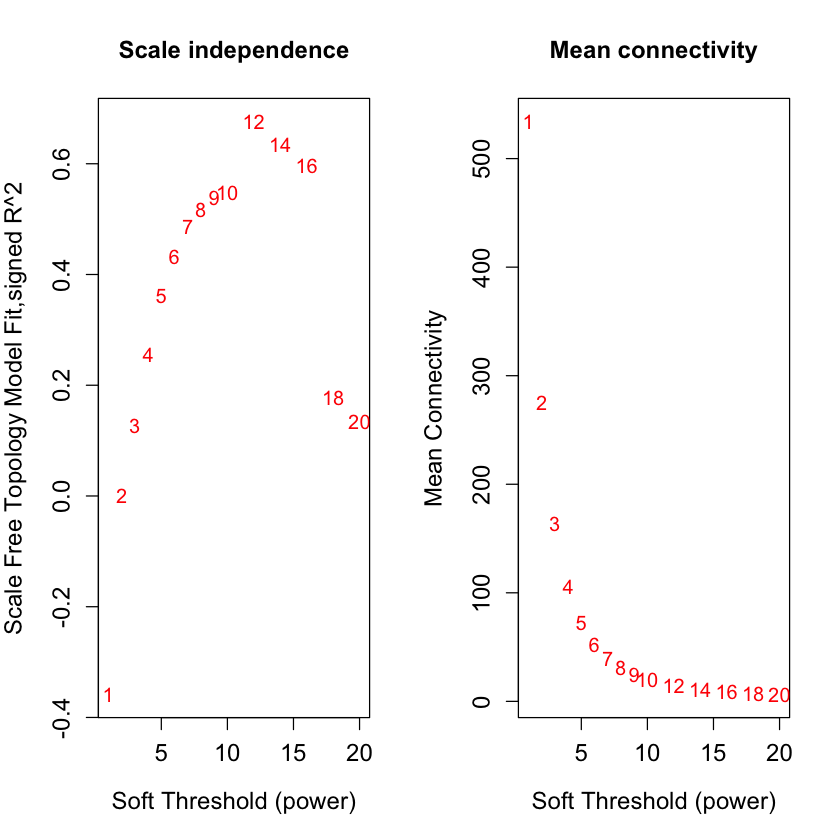

In [104]:
power(degR)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.
pickSoftThreshold: will use block size 2407.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 2407 of 2407
   Power SFT.R.sq slope truncated.R.sq mean.k. median.k. max.k.
1      1    0.502 -1.40          0.900 340.000  3.37e+02  728.0
2      2    0.762 -1.59          0.966  76.200  6.53e+01  288.0
3      3    0.860 -1.67          0.983  21.800  1.50e+01  129.0
4      4    0.896 -1.70          0.971   7.460  3.97e+00   62.5
5      5    0.934 -1.59          0.955   3.010  1.14e+00   32.3
6      6    0.292 -2.59          0.168   1.450  3.47e-01   22.3
7      7    0.354 -3.87 

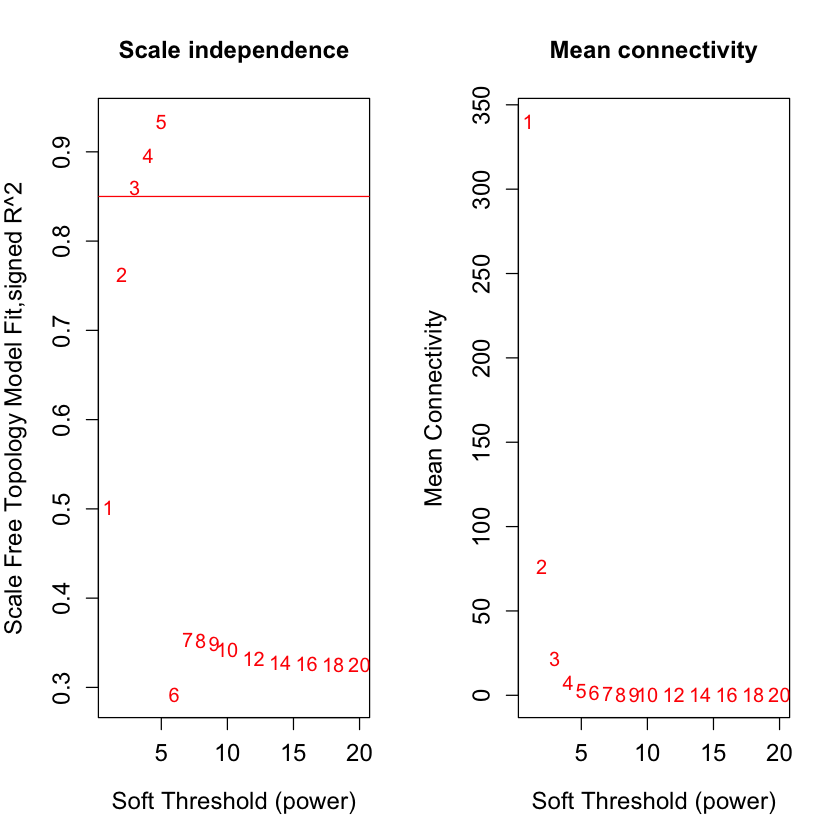

In [105]:
power(deg_GSE81653)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.
pickSoftThreshold: will use block size 5459.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 5459 of 5459


Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”
Warning message in eval(xpr, envir = envir):
“Some correlations are NA in block 1 : 5459 .”


   Power SFT.R.sq   slope truncated.R.sq  mean.k. median.k. max.k.
1      1 5.88e-01  2.3000          0.584 1370.000  1.38e+03 2280.0
2      2 4.81e-05 -0.0136          0.896  493.000  4.93e+02 1100.0
3      3 2.80e-01 -0.9350          0.928  214.000  2.04e+02  603.0
4      4 5.54e-01 -1.2400          0.980  105.000  9.26e+01  363.0
5      5 6.99e-01 -1.6600          0.979   56.500  4.53e+01  252.0
6      6 7.64e-01 -1.8900          0.974   32.500  2.38e+01  182.0
7      7 8.16e-01 -1.9700          0.982   19.800  1.30e+01  136.0
8      8 8.20e-01 -2.0600          0.970   12.600  7.42e+00  103.0
9      9 8.27e-01 -2.0900          0.974    8.380  4.38e+00   80.1
10    10 8.26e-01 -2.1100          0.968    5.770  2.68e+00   62.9
11    12 8.45e-01 -2.0800          0.981    3.020  1.15e+00   40.0
12    14 8.15e-01 -2.0900          0.946    1.780  5.25e-01   26.4
13    16 7.80e-01 -1.9600          0.914    1.170  2.26e-01   17.9
14    18 8.16e-01 -1.5900          0.834    0.846  1.03e-01   

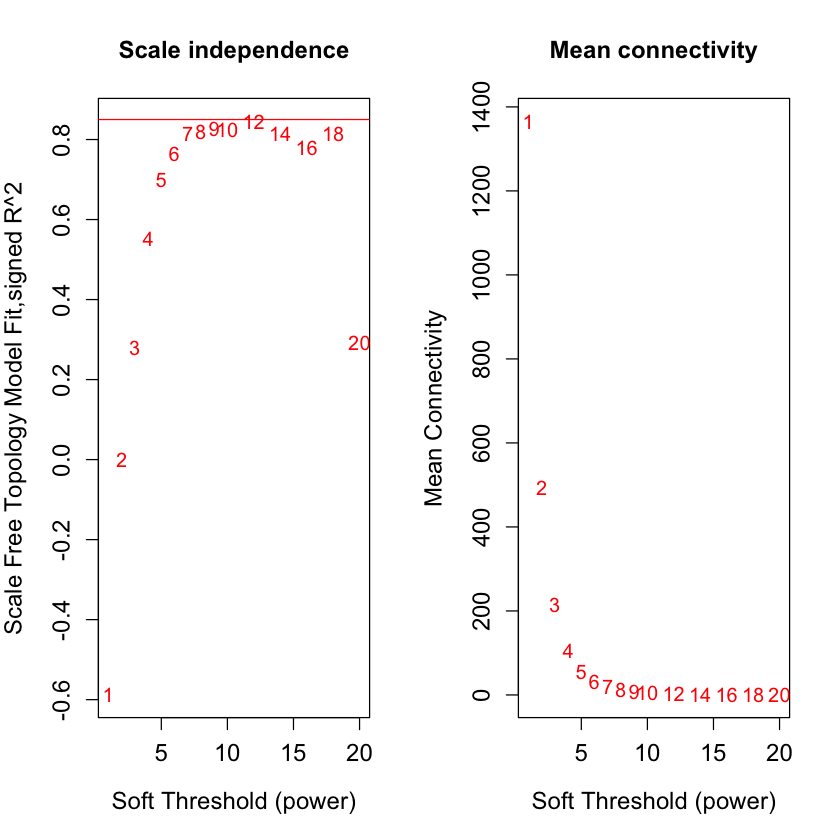

In [106]:
power(deg_array)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.
pickSoftThreshold: will use block size 2517.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 2517 of 2517
   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1   0.0433  0.150          0.806  530.00   504.000  993.0
2      2   0.8070 -0.647          0.916  206.00   163.000  575.0
3      3   0.9010 -0.905          0.927  107.00    67.300  393.0
4      4   0.8690 -0.993          0.905   65.20    33.800  291.0
5      5   0.8600 -1.050          0.904   44.10    17.600  226.0
6      6   0.8340 -1.060          0.900   31.80    10.100  181.0
7      7   0.7900

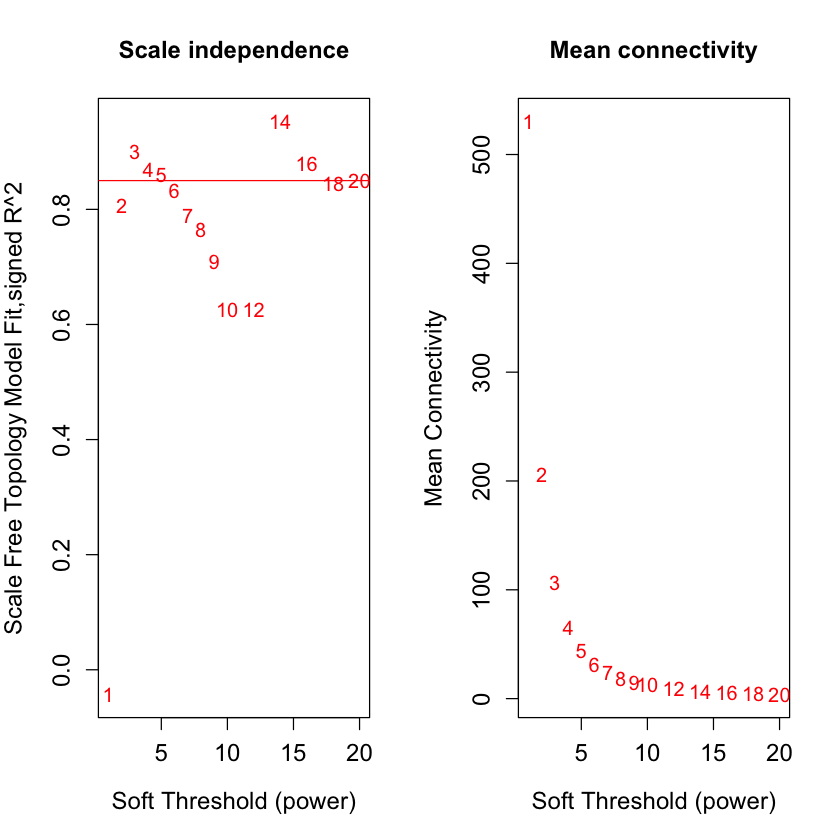

In [107]:
power(degstage14)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.
pickSoftThreshold: will use block size 1742.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 1742 of 1742
   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1    0.128  0.178          0.556  403.00   393.000  753.0
2      2    0.876 -0.552          0.864  176.00   146.000  471.0
3      3    0.905 -0.731          0.884  100.00    64.600  335.0
4      4    0.904 -0.778          0.897   65.60    33.400  254.0
5      5    0.884 -0.806          0.874   46.70    20.600  200.0
6      6    0.864 -0.839          0.873   35.10    13.900  163.0
7      7    0.840

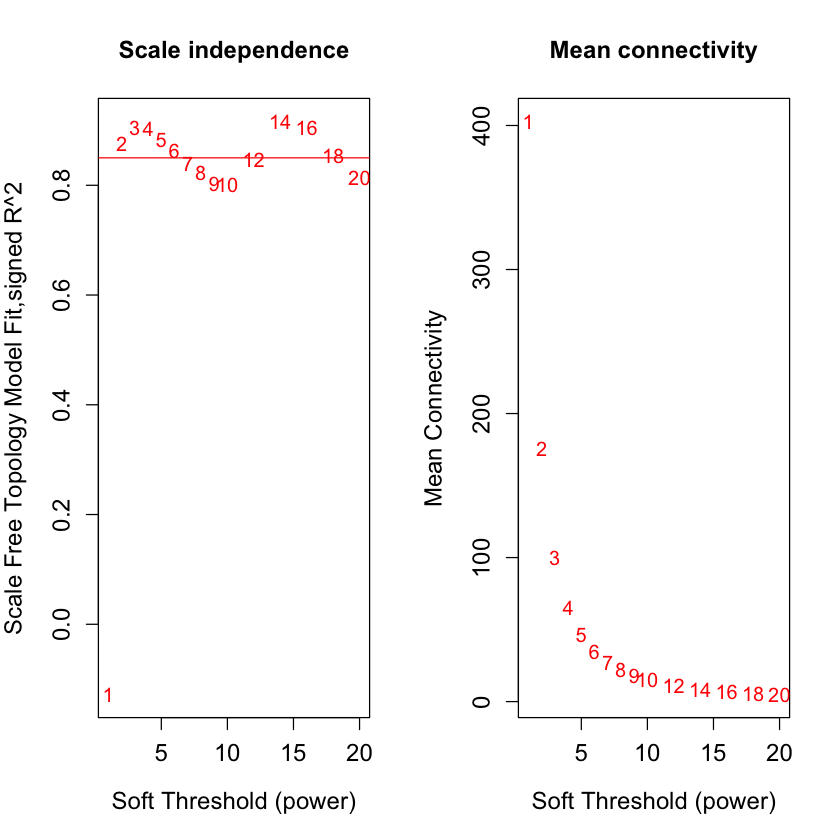

In [108]:
power(degstage23)

In [213]:
TOM_Matrices = function(dataset){

  library(WGCNA)

  enableWGCNAThreads(nThreads=12)
  allowWGCNAThreads()
  options(stringsAsFactors = FALSE)

  dataset = t(dataset)
  adj = abs(cor(dataset, use='p'))^4

  dissTOM = TOMdist(adj)
    
  hierTOMa = hclust(as.dist(dissTOM), method='average')

  Gene_Modules = labels2colors(cutreeDynamic(hierTOMa, method='tree', cutHeight=0.99))
  Gene_Clusters = labels2colors(cutreeDynamic(hierTOMa, distM= dissTOM , cutHeight = 0.99,
                                               deepSplit=3, pamRespectsDendro = FALSE))


  plotDendroAndColors(hierTOMa,
                      colors = data.frame(Gene_Clusters),
                      dendroLabels = FALSE,
                      cex.axis = 1.2)

  return(Gene_Modules)

}

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 12 working processes.
Allowing multi-threading with up to 8 threads.
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..done.


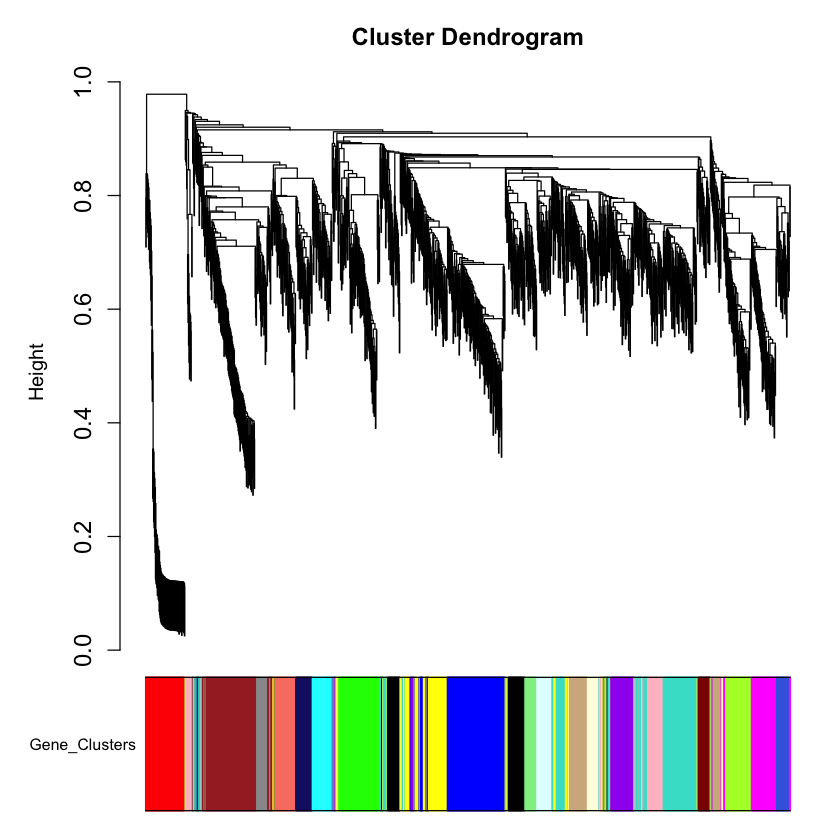

In [214]:
rnaseq = TOM_Matrices(degR)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 12 working processes.
Allowing multi-threading with up to 8 threads.
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..done.


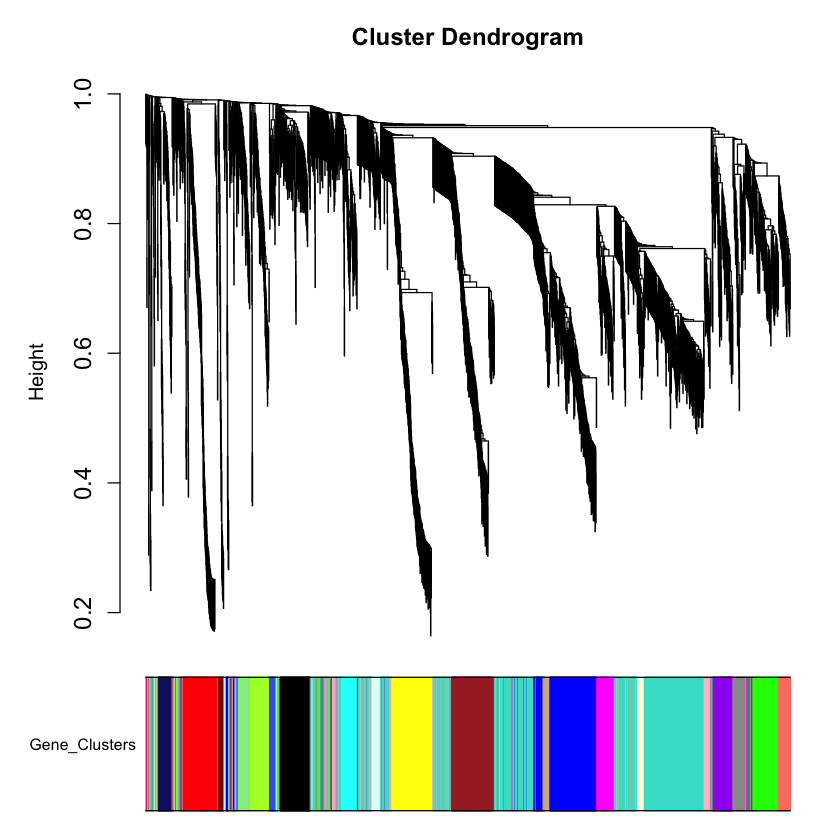

In [215]:
stage4 = TOM_Matrices(degstage14)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 12 working processes.
Allowing multi-threading with up to 8 threads.
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..done.


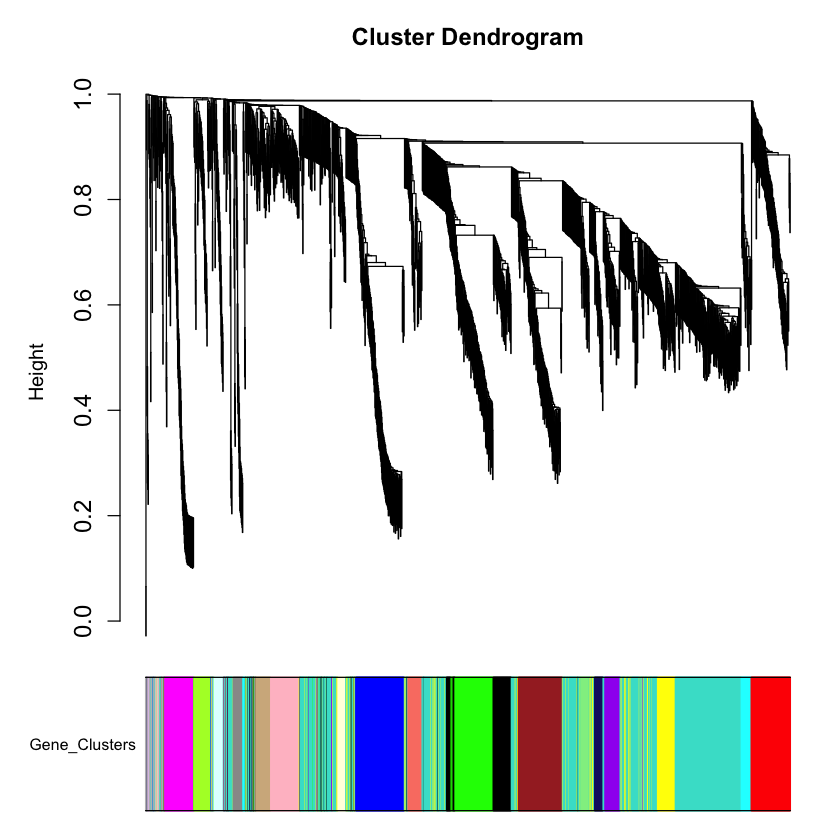

In [216]:
stage23 = TOM_Matrices(degstage23)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 12 working processes.
Allowing multi-threading with up to 8 threads.
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..done.


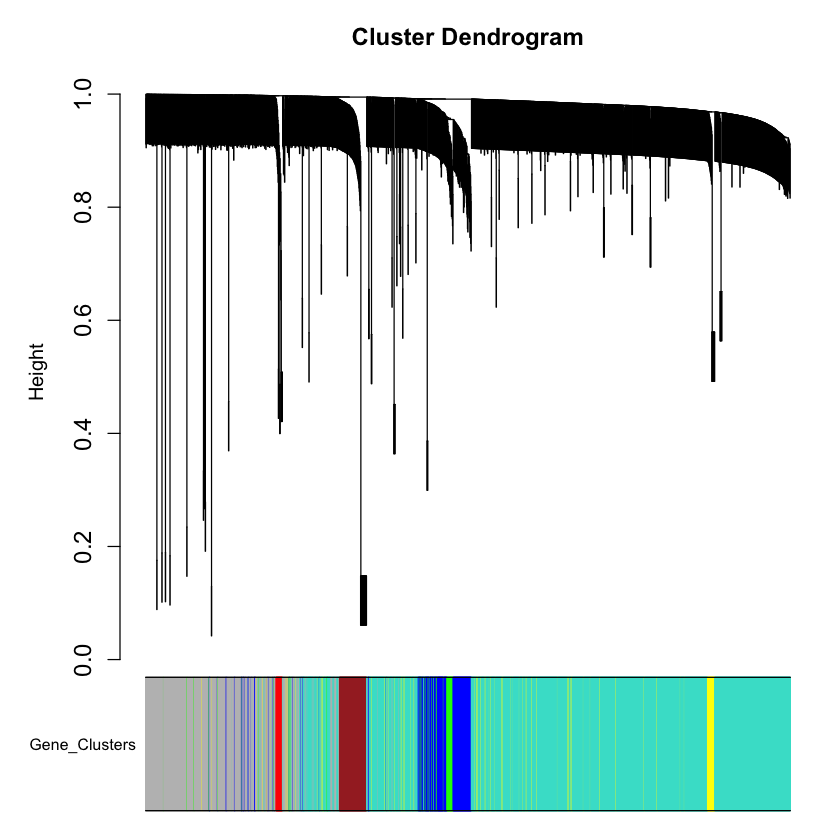

In [217]:
dendro_GSE81653 = TOM_Matrices(deg_GSE81653)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 12 working processes.
Allowing multi-threading with up to 8 threads.
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..done.


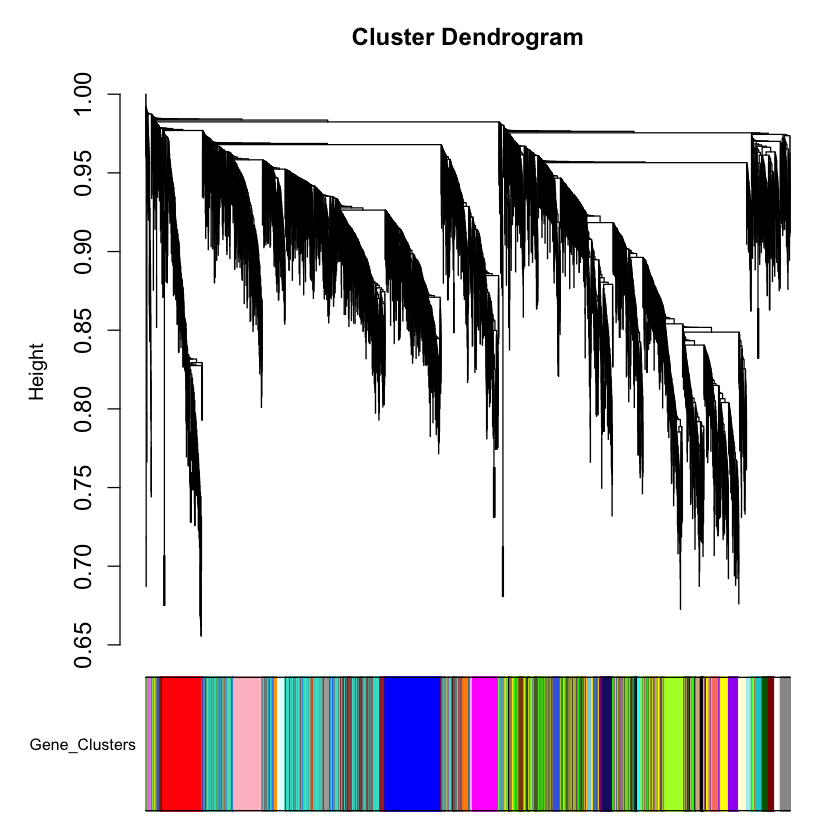

In [218]:
dendro_array = TOM_Matrices(deg_array)

In [377]:
eigenetic_network = function(dataset, colorh1){

  enableWGCNAThreads(nThreads=32)
  allowWGCNAThreads()
  options(stringsAsFactors = FALSE)

  ADJ1 = abs(cor(t(dataset), use='p'))^7

  colors = unique(colorh1)
  Alldegrees1 = intramodularConnectivity(ADJ1, colorh1)

  datME = moduleEigengenes(t(dataset),colorh1)$eigengenes
  MET = orderMEs(cbind(datME))
  datKME = signedKME(t(dataset), datME, outputColumnName='')

  return(datKME)

}

In [378]:
rnaseq_eigenes = eigenetic_network(degR, rnaseq)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.


In [379]:
stage4_eigenes = eigenetic_network(degstage14, stage4)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.


In [380]:
stage23_eigenes = eigenetic_network(degstage23, stage23)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.


In [381]:
array_eigenes = eigenetic_network(deg_array, dendro_array)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.


Warning message in knnimp(x, k, maxmiss = rowmax, maxp = maxp):
“1 rows with more than 50 % entries missing;
 mean imputation used for these rows”
Warning message in signedKME(t(dataset), datME, outputColumnName = ""):
“Some gene expressions have fewer than 4 observations.
     Hint: consider removing genes with too many missing values or collect more arrays.”


In [382]:
GSE81653_eigenes = eigenetic_network(deg_GSE81653, dendro_GSE81653)

Warning in allowWGCNAThreads: Requested number of threads is higher than number
 of available processors (or cores). Using too many threads may degrade code performance. It is recommended that the number of threads is no more than number
 of available processors.

Allowing parallel execution with up to 32 working processes.
Allowing multi-threading with up to 8 threads.


In [383]:
cbind.fill = function (...){

  nm = list(...)
  nm = lapply(nm, as.matrix)

  n = max(sapply(nm, nrow))
  do.call(cbind, lapply(nm, function (x)
    rbind(x, matrix(, n-nrow(x), ncol(x)))))

}
                

In [401]:
enrichment = function(dataset, colorh1, datKME, name){
    
    library(clusterProfiler)
    library(dplyr)
    library(org.Hs.eg.db)
    library(enrichplot)
    
    intModules = table(colorh1)
    intModules = as.data.frame(intModules)
    intModules =intModules$colorh1
    intModules = as.character(intModules)
    
    dat = data.frame()
    dat_new = data.frame()
    
    colrs = c()
    newclors = c()
    
    dataset = t(dataset)
    for (color in intModules){
        
        color =  color
        FilterGenes = abs(subset(datKME, select=c(color))) > 0.95
        genes = dimnames(data.frame(dataset))[[2]][FilterGenes]
        
        dat = cbind.fill(dat, genes, fill = NA)
        colrs = append(color, colrs)
    
    }
    
    dat = dat[,seq(1,ncol(dat),2)]
    colnames(dat) = colrs
    dat = as.data.frame(dat)
    
    dat = dat[,!names(dat) %in% c("grey")]
    colrs = colnames(dat)
    
    for (j in 1:ncol(dat)){
        
        gene = dat[, j]
        
        if (all(is.na(gene)) == FALSE){
            
            eg = bitr(gene, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")
            genes <- eg$ENTREZID
            dat_new <- cbind.fill(dat_new, genes, fill = NA)
            newclors <- append(newclors, colrs[j])
            
        }
        
    }
    
    dat_new = dat_new[,seq(1, ncol(dat_new), 2)]
    colnames(dat_new) = newclors
    dat_new = as.data.frame(dat_new)
    
    names = paste0('C', 1:ncol(dat_new))
    colnames(dat_new) = names
    
    
    write.csv(dat_new, paste('/Users/lebohangmashatola/downloads/CRCPhenotypePredictionTool-main/expression/',name, '.csv', sep=''))
    return(dat_new)


}

In [402]:
rnaseq_enrich = enrichment(degR, rnaseq, rnaseq_eigenes, 'rnaseq_clusters')

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“25% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“11.11% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“4% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“10% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“20% of input gene IDs are fail to map...”
'select(

In [403]:
stage4_enrich = enrichment(degstage14, stage4, stage4_eigenes, 'stage4_clusters')

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“3.12% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“7.14% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“3.85% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“33.33% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“20% of input gene IDs are fail to map...”
'

In [305]:
stage23_enrich = enrichment(degstage23, stage23, stage23_eigenes)

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“5.56% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“0.75% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“0.85% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“10% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“0.96% of input gene IDs are fail to map...”
's

In [404]:
array_enrich = enrichment(deg_array, dendro_array, array_eigenes, 'array_clusters')

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“10% of input gene IDs are fail to map...”


ERROR: Error in `colnames<-`(`*tmp*`, value = newclors): attempt to set 'colnames' on an object with less than two dimensions


In [399]:
GSE81653_ennrich = enrichment(deg_GSE81653, dendro_GSE81653, GSE81653_eigenes, 'GSE81653_clusters')

'select()' returned 1:1 mapping between keys and columns



ERROR: Error in `colnames<-`(`*tmp*`, value = newclors): attempt to set 'colnames' on an object with less than two dimensions


In [324]:
clusterPrMF = function(dat_new, w, h){
    
    dat_new = dat_new[,!names(dat_new) %in% c("grey")]
    
    cMF = compareCluster(geneCluster = dat_new, fun = "enrichGO", pvalueCutoff = 0.05, OrgDb = org.Hs.eg.db,
                         ont = "MF", pAdjustMethod = "BH")
    
    #options(repr.plot.width=w,repr.plot.height=h,repr.plot.res=150)
    enrichplot::dotplot(cMF, showCategory = 10)

}

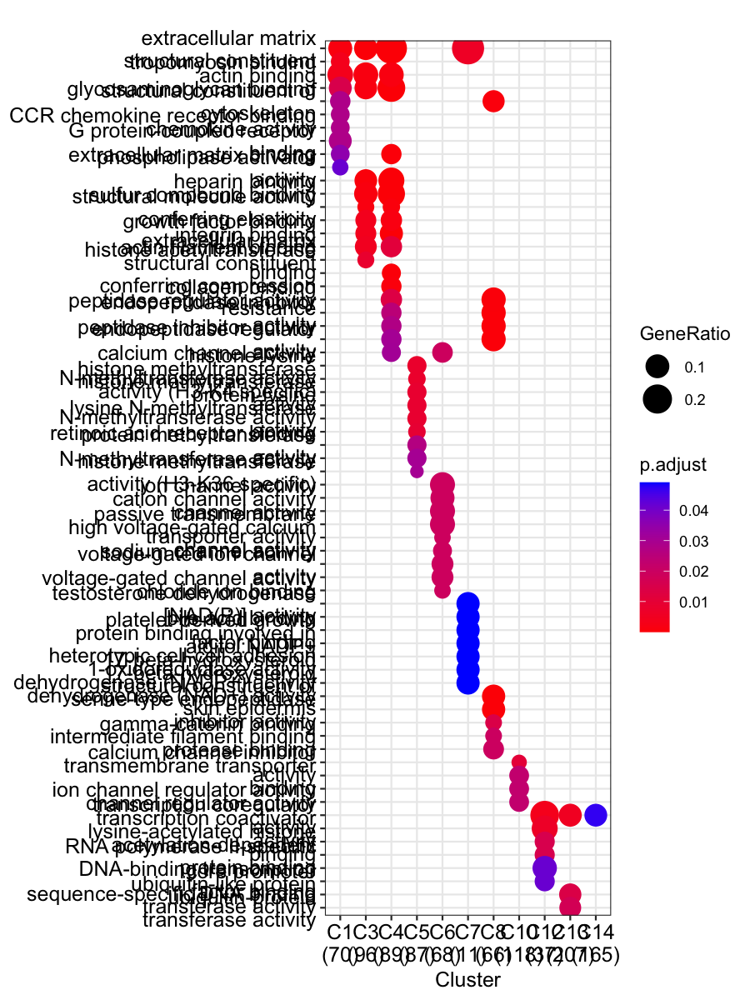

In [360]:
clusterPrMF(rnaseq_enrich,8,10)

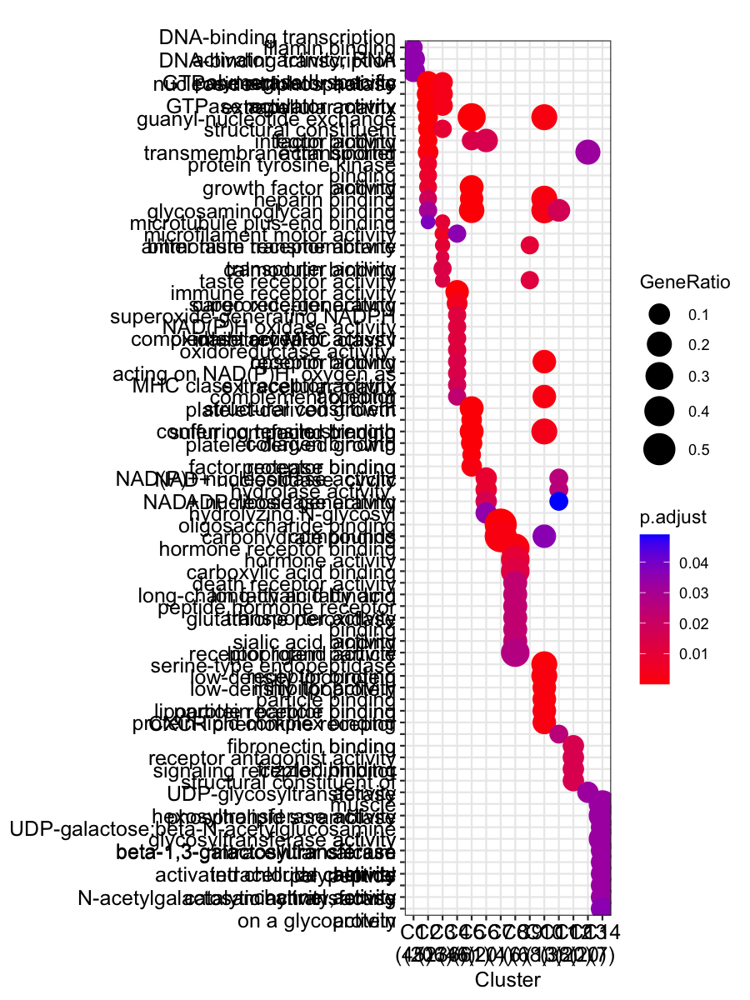

In [358]:
clusterPrMF(stage4_enrich,9,13)

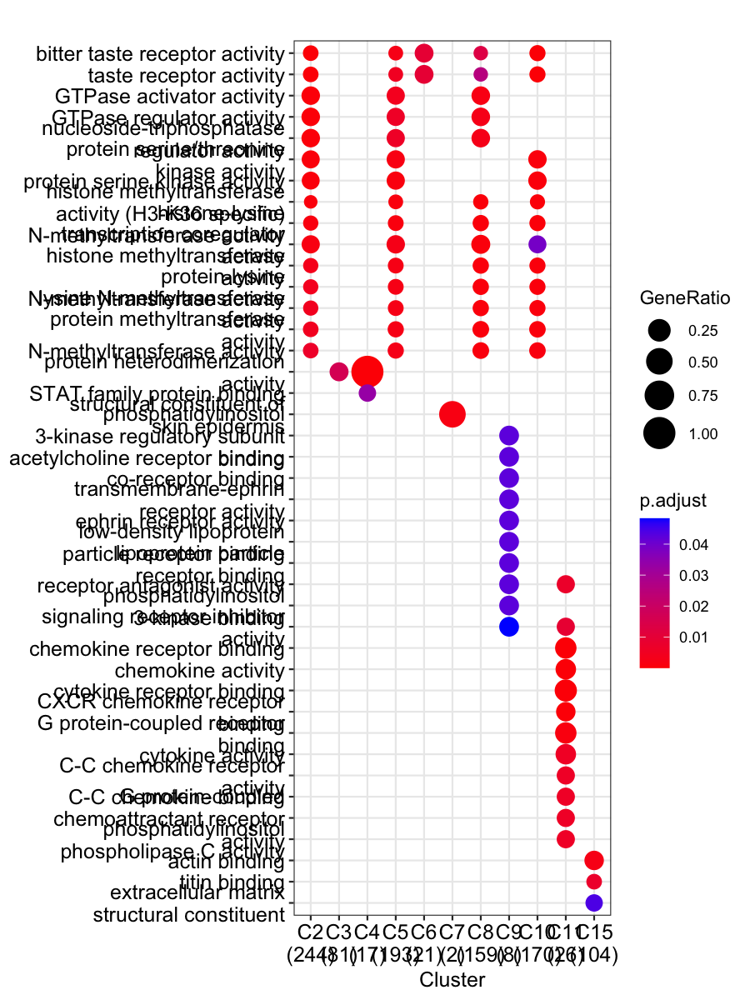

In [357]:
clusterPrMF(stage23_enrich,8,9)

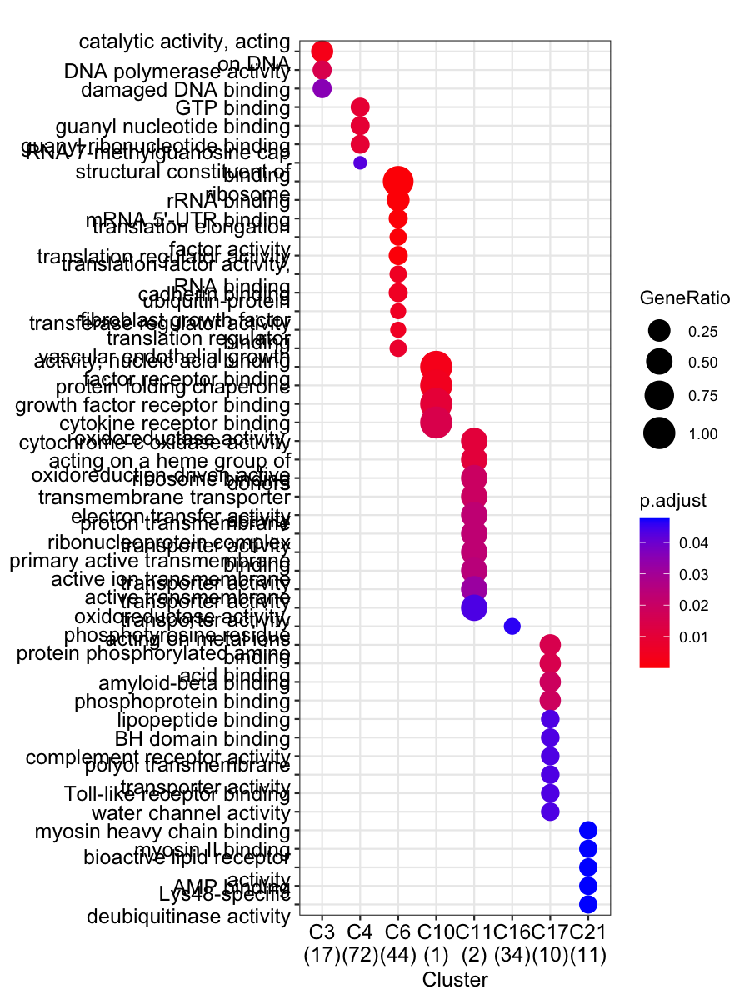

In [356]:
clusterPrMF(array_enrich,7,8)

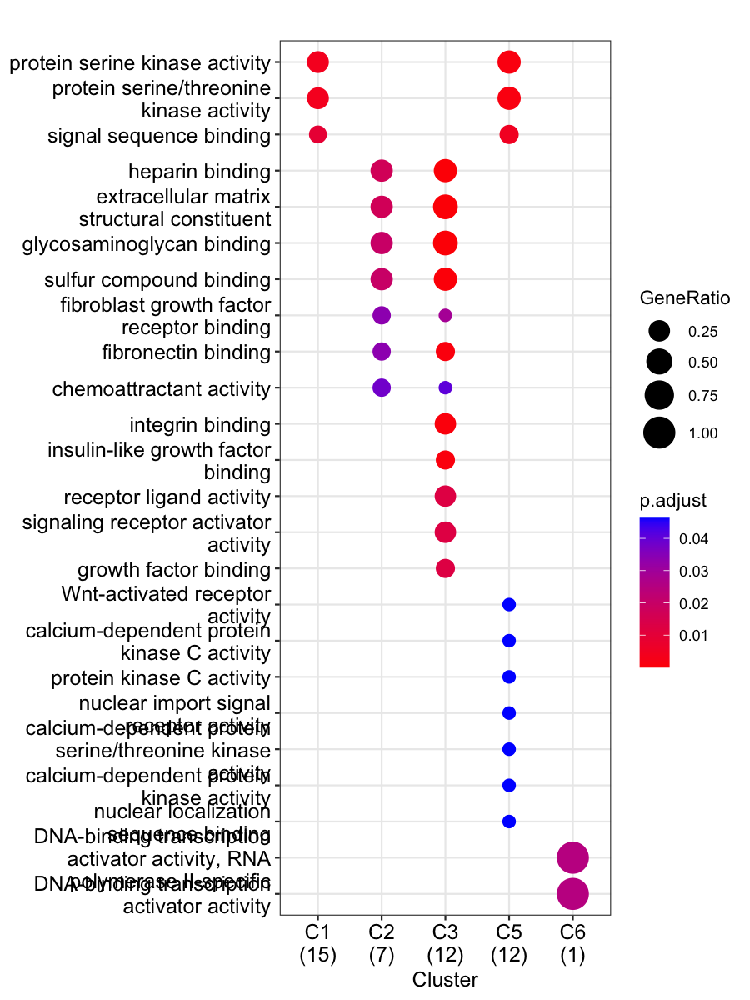

In [355]:
clusterPrMF(GSE81653_ennrich,5,7)

In [330]:
clusterPrBP = function(dat_new, w, h){
    
    dat_new = dat_new[,!names(dat_new) %in% c("grey")]
    cBp = compareCluster(geneCluster = dat_new, fun = "enrichGO", pvalueCutoff = 0.05, OrgDb = org.Hs.eg.db,
                         ont = "BP", pAdjustMethod = "BH")
    
    options(repr.plot.width=w,repr.plot.height=h,repr.plot.res=150)
    enrichplot::dotplot(cBp, showCategory = 5)

}

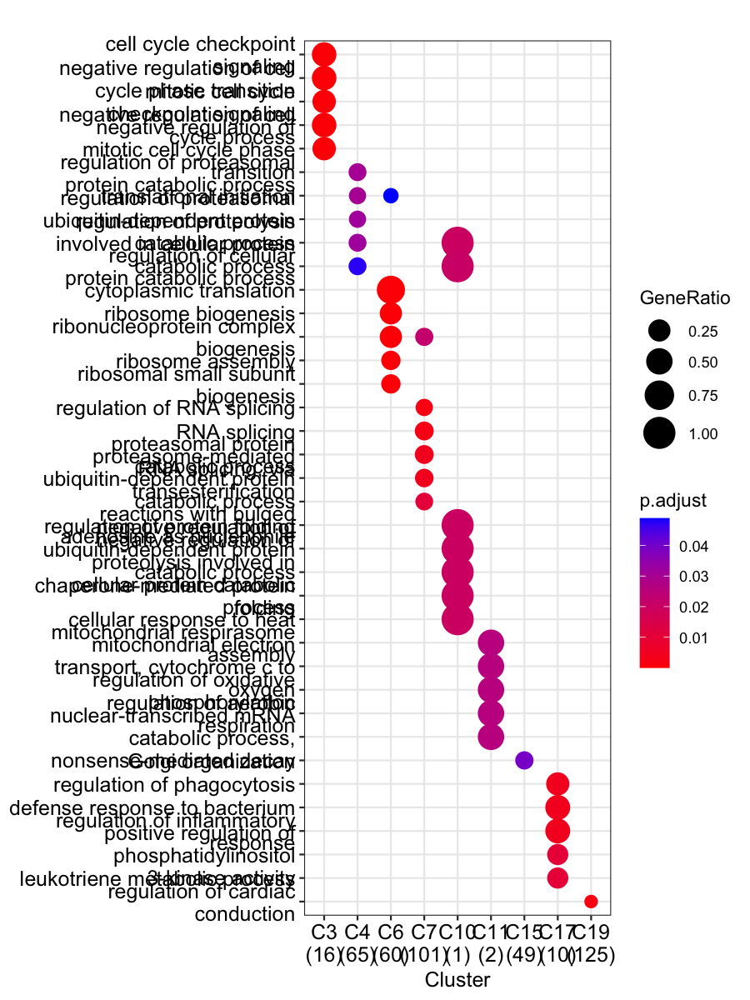

In [354]:
clusterPrBP(array_enrich, 6, 8)

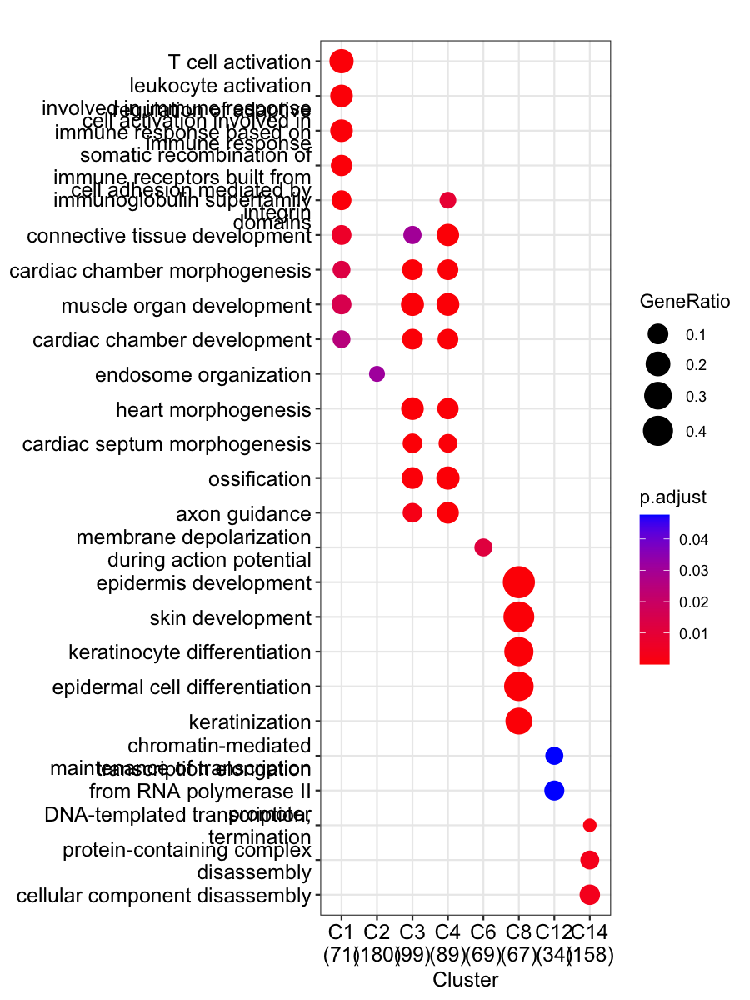

In [353]:
clusterPrBP(rnaseq_enrich,6,8)

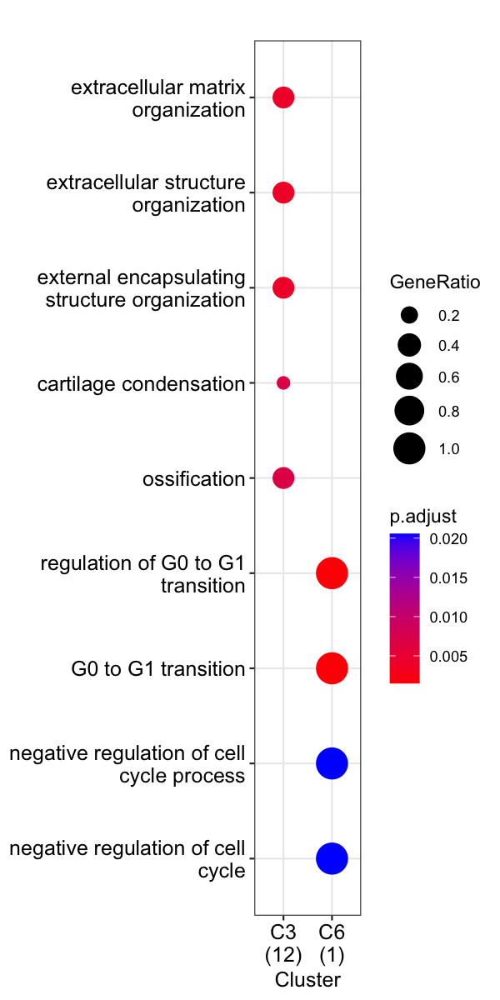

In [352]:
clusterPrBP(GSE81653_ennrich, 5,8)

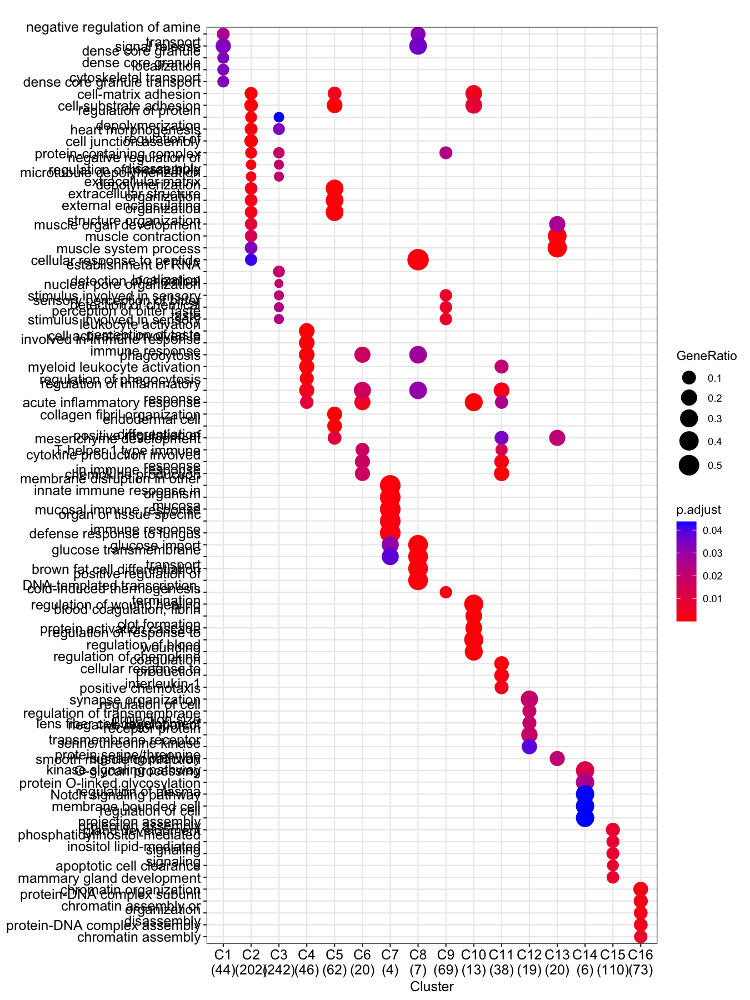

In [351]:
clusterPrBP(stage4_enrich, 9, 12)

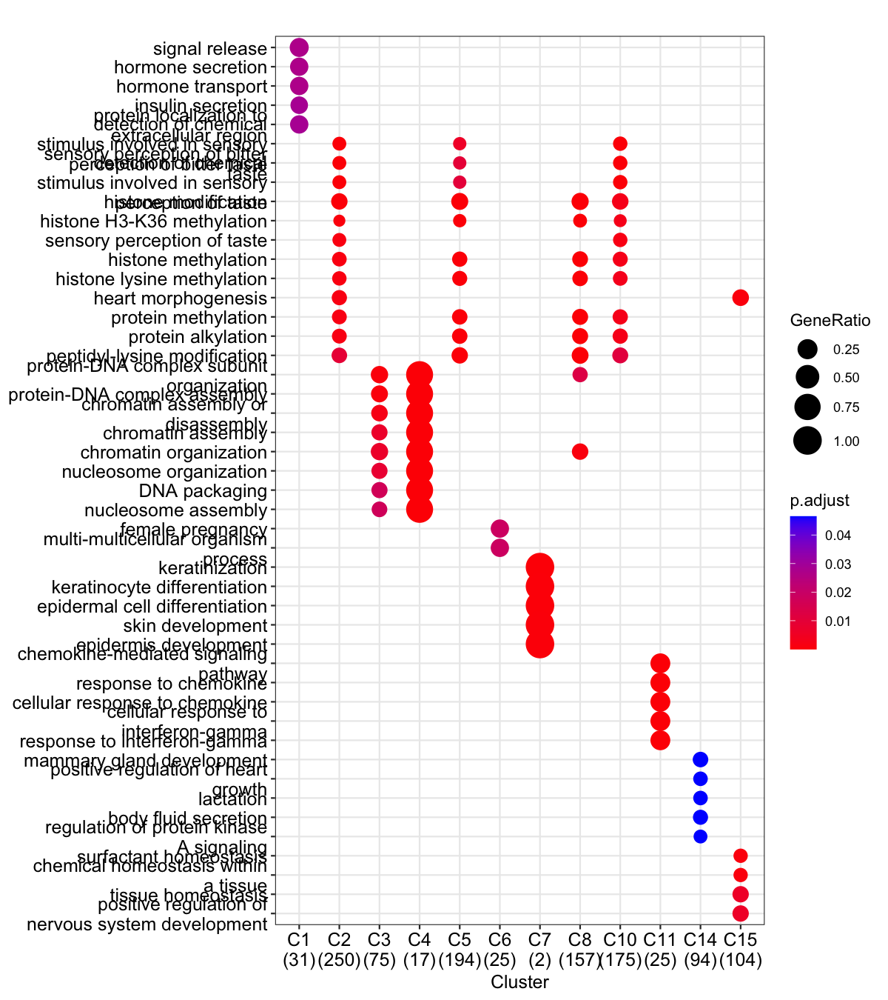

In [350]:
clusterPrBP(stage23_enrich,8,9)

In [337]:
clusterKEGG = function(dat_new, w, h){
    

    
    dat_new = dat_new[,!names(dat_new) %in% c("grey")]
    ck = compareCluster(geneCluster = dat_new, fun = enrichKEGG)
    
    options(repr.plot.width=w,repr.plot.height=h,repr.plot.res=150)
    enrichplot::dotplot(ck)

}

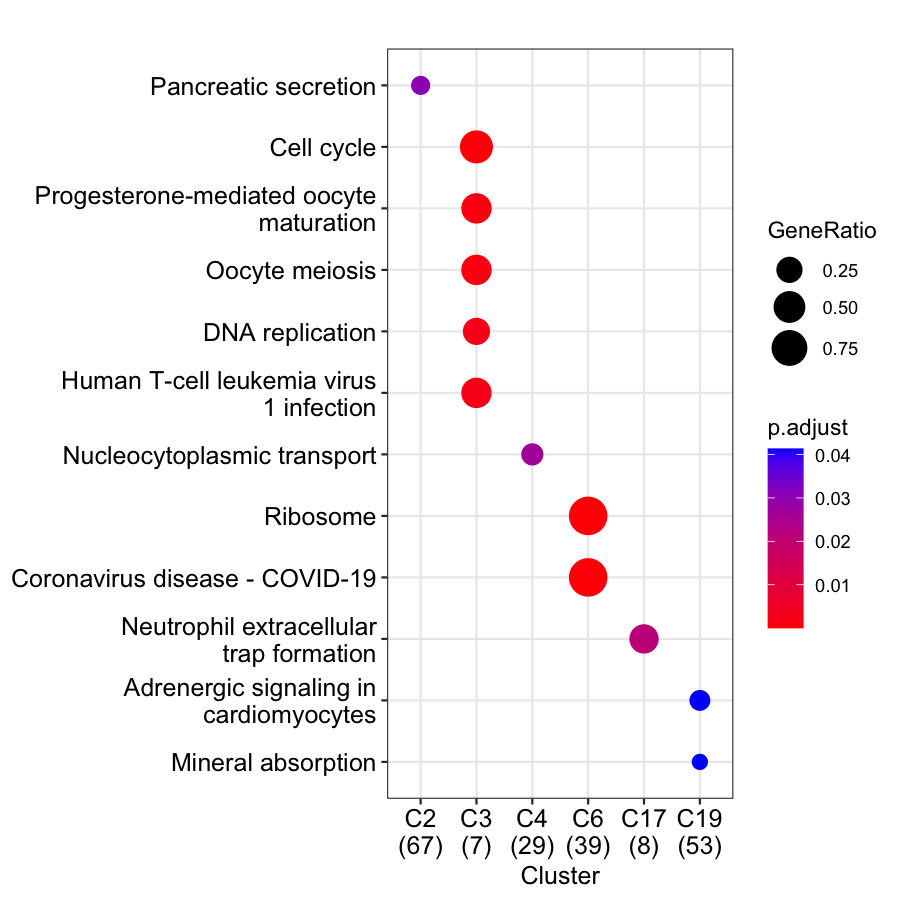

In [349]:
clusterKEGG(array_enrich, 6, 6)

In [340]:
clusterKEGG(GSE81653_ennrich, 7,8)

ERROR: Error in compareCluster(geneCluster = dat_new, fun = enrichKEGG): No enrichment found in any of gene cluster, please check your input...


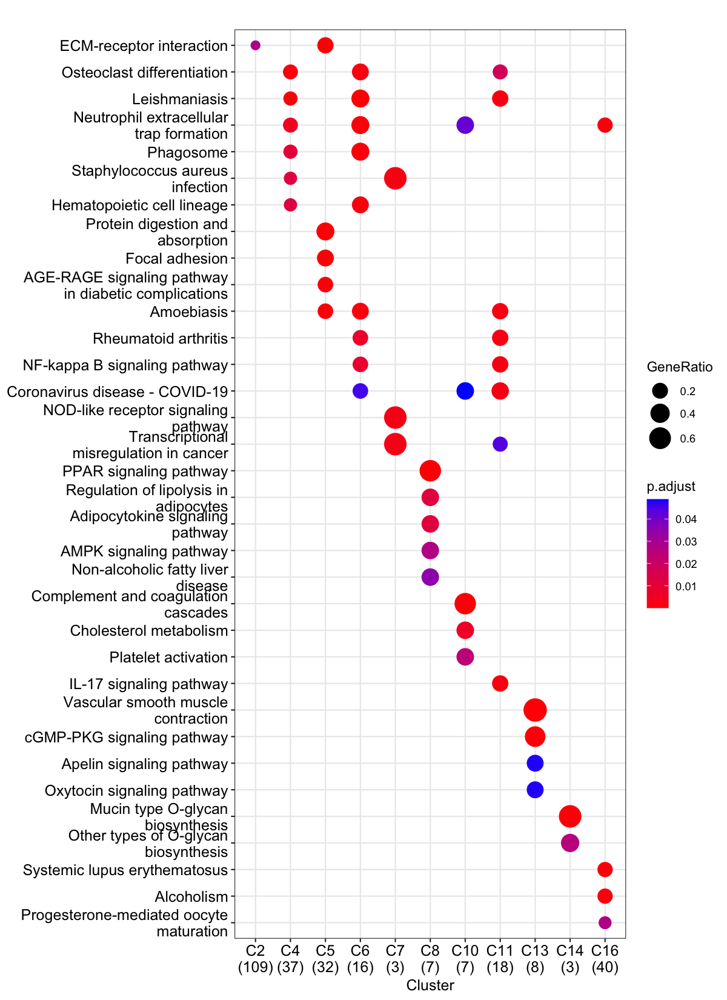

In [348]:
clusterKEGG(stage4_enrich,8,11)

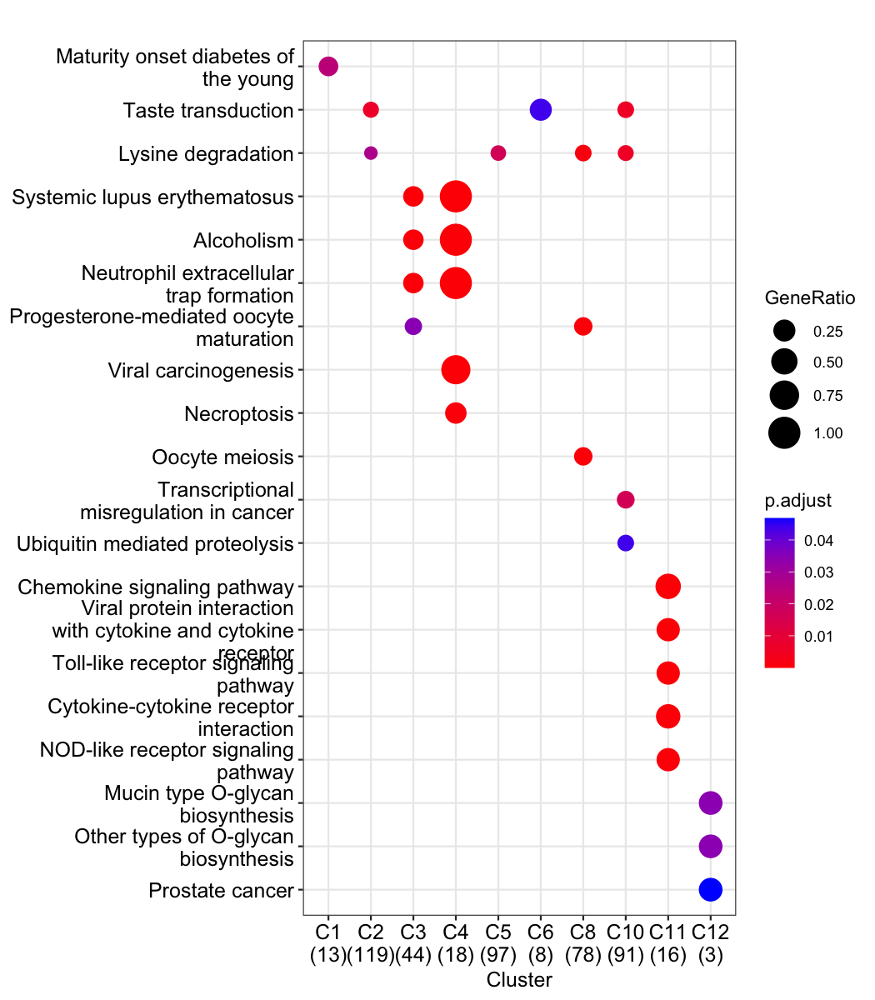

In [347]:
clusterKEGG(stage23_enrich,7,8)

In [464]:
all_clusters = function(){
    
    all_clusters = read.csv('/Users/lebohangmashatola/downloads/CRCPhenotypePredictionTool-main/expression/all_clusters.csv', sep=';')
    all_clusters = all_clusters[,-1]
    dat_new = data.frame()
    
    for (j in 1:ncol(all_clusters)){
        
        gene = all_clusters[, j]
        
        if (all(is.na(gene)) == FALSE){
            
            eg = bitr(gene, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")
            genes <- eg$ENTREZID
            dat_new <- cbind.fill(dat_new, genes, fill = NA)
        
        }
    }
    
    dat_new = dat_new[, colMeans(is.na(dat_new)) != 1]
    
    dat_new = as.data.frame(dat_new)
    names = paste0('C', 1:ncol(dat_new))
    colnames(dat_new) = names
    
    ck = compareCluster(geneCluster = dat_new, fun = enrichKEGG)
    
    cMF = compareCluster(geneCluster = dat_new, fun = "enrichGO", pvalueCutoff = 0.05, OrgDb = org.Hs.eg.db,
                         ont = "MF", pAdjustMethod = "BH")
    
    cBp = compareCluster(geneCluster = dat_new, fun = "enrichGO", pvalueCutoff = 0.05, OrgDb = org.Hs.eg.db,
                         ont = "BP", pAdjustMethod = "BH")
    
    return(c(ck, cMF, cBp))
    
}


In [465]:
df_all = all_clusters()

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“7.14% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“33.33% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“20% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“20% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(gene, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“33.33% of input gene IDs are fail to map...”
's

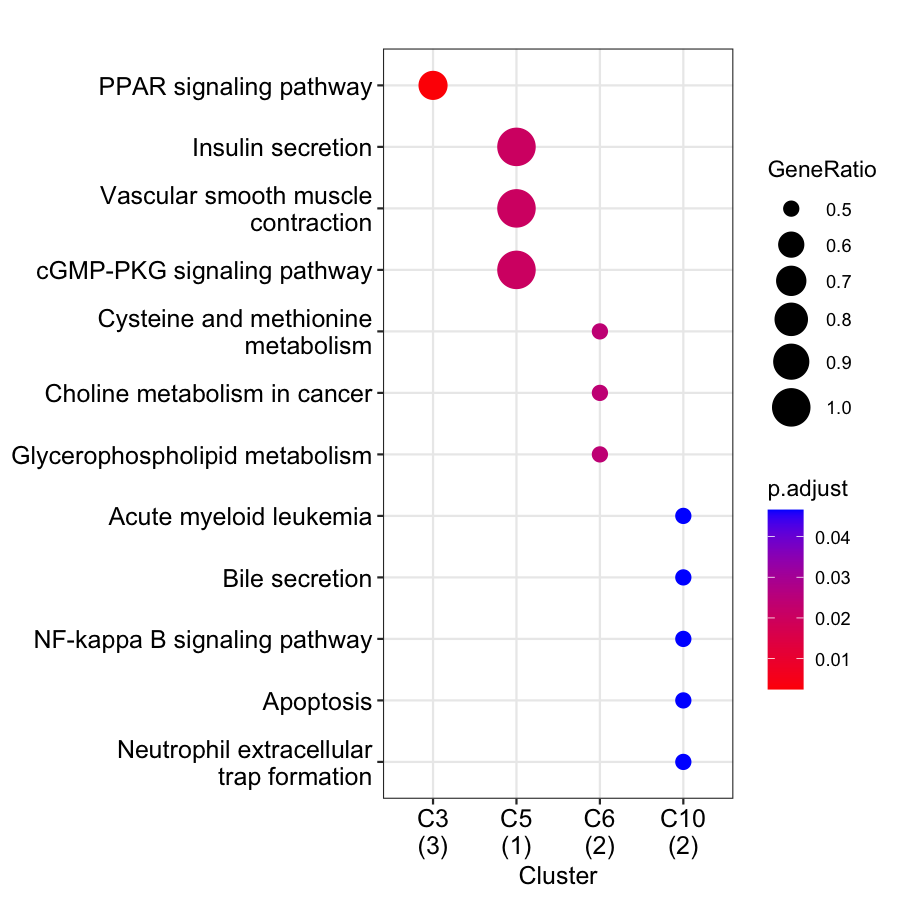

In [492]:
options(repr.plot.width=6,repr.plot.height=6,repr.plot.res=150)
enrichplot::dotplot(df_all[[1]])

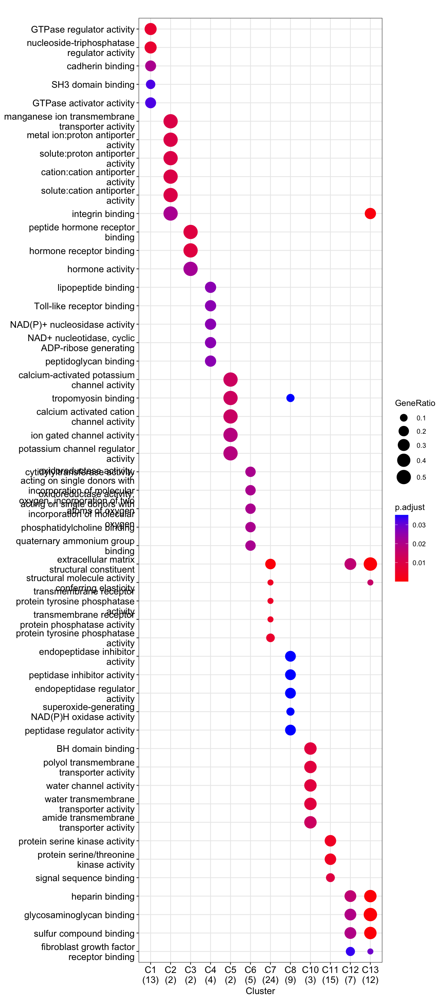

In [488]:
options(repr.plot.width=8,repr.plot.height=18,repr.plot.res=150)
enrichplot::dotplot(df_all[[2]])

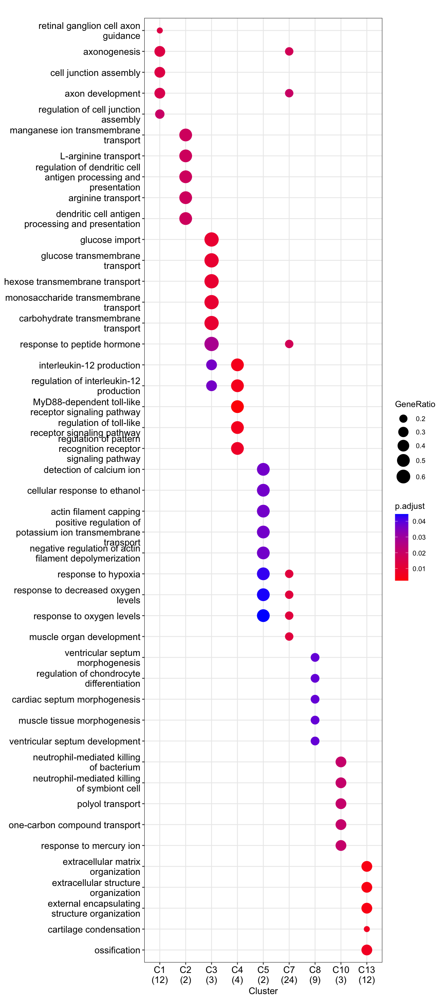

In [489]:
options(repr.plot.width=8,repr.plot.height=18,repr.plot.res=150)
enrichplot::dotplot(df_all[[3]])